In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
from glob import glob
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
from skimage.io import imread, imshow
from itertools import chain

EDA is open-ended, and it is up to you to decide how to look at different ways to slice and dice your data. A good starting point is to look at the requirements for the FDA documentation in the final part of this project to guide (some) of the analyses you do. 

This EDA should also help to inform you of how pneumonia looks in the wild. E.g. what other types of diseases it's commonly found with, how often it is found, what ages it affects, etc. 

Note that this NIH dataset was not specifically acquired for pneumonia. So, while this is a representation of 'pneumonia in the wild,' the prevalence of pneumonia may be different if you were to take only chest x-rays that were acquired in an ER setting with suspicion of pneumonia. 

Perform the following EDA:
* The patient demographic data such as gender, age, patient position,etc. (as it is available)
* The x-ray views taken (i.e. view position)
* The number of cases including: 
    * number of pneumonia cases,
    * number of non-pneumonia cases
* The distribution of other diseases that are comorbid with pneumonia
* Number of disease per patient 
* Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases.

Note: use full NIH data to perform the first a few EDA items and use `sample_labels.csv` for the pixel-level assassements. 

Also, **describe your findings and how will you set up the model training based on the findings.**

# Data loading and preparation

In [4]:
## Load NIH data
all_xray_df = pd.read_csv('/mnt/data/Datasets/chestxray/NIH_chest_xrays/data/Data_Entry_2017.csv')
display(all_xray_df.info())
display(all_xray_df.describe())
all_xray_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112120 entries, 0 to 112119
Data columns (total 12 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112120 non-null  object 
 1   Finding Labels               112120 non-null  object 
 2   Follow-up #                  112120 non-null  int64  
 3   Patient ID                   112120 non-null  int64  
 4   Patient Age                  112120 non-null  int64  
 5   Patient Gender               112120 non-null  object 
 6   View Position                112120 non-null  object 
 7   OriginalImage[Width          112120 non-null  int64  
 8   Height]                      112120 non-null  int64  
 9   OriginalImagePixelSpacing[x  112120 non-null  float64
 10  y]                           112120 non-null  float64
 11  Unnamed: 11                  0 non-null       float64
dtypes: float64(3), int64(5), object(4)
memory usage: 10.3+ MB


None

,Follow-up #,Patient ID,Patient Age,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
count,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,112120.000000,0.0
mean,8.573751,14346.381743,46.901463,2646.078844,2486.438842,0.155649,0.155649,NaN
std,15.406320,8403.876972,16.839923,341.246429,401.268227,0.016174,0.016174,NaN
min,0.000000,1.000000,1.000000,1143.000000,966.000000,0.115000,0.115000,NaN
25%,0.000000,7310.750000,35.000000,2500.000000,2048.000000,0.143000,0.143000,NaN
50%,3.000000,13993.000000,49.000000,2518.000000,2544.000000,0.143000,0.143000,NaN
75%,10.000000,20673.000000,59.000000,2992.000000,2991.000000,0.168000,0.168000,NaN
max,183.000000,30805.000000,414.000000,3827.000000,4715.000000,0.198800,0.198800,NaN


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
102479,00027305_000.png,No Finding,0,27305,43,F,PA,2620,2600,0.143,0.143,NaN
77063,00018925_000.png,No Finding,0,18925,53,F,PA,2882,2625,0.143,0.143,NaN
8865,00002339_012.png,No Finding,12,2339,58,F,AP,2500,2048,0.168,0.168,NaN
84742,00020868_001.png,Infiltration,1,20868,21,M,PA,2438,2713,0.143,0.143,NaN
28707,00007497_012.png,No Finding,12,7497,63,M,PA,2992,2991,0.143,0.143,NaN


In [5]:
## Load 'sample_labels.csv' data for pixel level assessments
sample_df = pd.read_csv('sample_labels.csv')
display(sample_df.info())
display(sample_df.describe())
sample_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5606 entries, 0 to 5605
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Image Index                  5606 non-null   object 
 1   Finding Labels               5606 non-null   object 
 2   Follow-up #                  5606 non-null   int64  
 3   Patient ID                   5606 non-null   int64  
 4   Patient Age                  5606 non-null   object 
 5   Patient Gender               5606 non-null   object 
 6   View Position                5606 non-null   object 
 7   OriginalImageWidth           5606 non-null   int64  
 8   OriginalImageHeight          5606 non-null   int64  
 9   OriginalImagePixelSpacing_x  5606 non-null   float64
 10  OriginalImagePixelSpacing_y  5606 non-null   float64
dtypes: float64(2), int64(4), object(5)
memory usage: 481.9+ KB


None

,Follow-up #,Patient ID,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
count,5606.000000,5606.000000,5606.000000,5606.000000,5606.000000,5606.000000
mean,8.616661,14330.617017,2644.795755,2491.087406,0.155467,0.155467
std,15.565815,8411.477789,347.188754,399.119063,0.016201,0.016201
min,0.000000,13.000000,1362.000000,966.000000,0.115000,0.115000
25%,0.000000,7289.000000,2500.000000,2048.000000,0.143000,0.143000
50%,3.000000,13993.000000,2542.000000,2544.000000,0.143000,0.143000
75%,10.000000,20655.500000,2992.000000,2991.000000,0.168000,0.168000
max,177.000000,30797.000000,3266.000000,3056.000000,0.198800,0.198800


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
1160,00006144_001.png,No Finding,1,6144,049Y,M,PA,2992,2991,0.143000,0.143000
3315,00016403_001.png,Nodule,1,16403,058Y,M,PA,2992,2991,0.143000,0.143000
5392,00029124_001.png,No Finding,1,29124,027Y,F,PA,1870,2021,0.194311,0.194311
464,00002437_000.png,No Finding,0,2437,054Y,F,PA,2048,2500,0.171000,0.171000
862,00004519_016.png,No Finding,16,4519,058Y,M,PA,2500,2048,0.168000,0.168000


### Change columns names in *all_xray_df* thus the names will be the same as in the *sample_df* and remove 'Unnamed: 11' columns.

In [6]:
final_df = all_xray_df.drop(all_xray_df.columns[-1], 1)
final_df.columns = sample_df.columns
final_df.info()
final_df.sample(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112120 entries, 0 to 112119
Data columns (total 11 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Image Index                  112120 non-null  object 
 1   Finding Labels               112120 non-null  object 
 2   Follow-up #                  112120 non-null  int64  
 3   Patient ID                   112120 non-null  int64  
 4   Patient Age                  112120 non-null  int64  
 5   Patient Gender               112120 non-null  object 
 6   View Position                112120 non-null  object 
 7   OriginalImageWidth           112120 non-null  int64  
 8   OriginalImageHeight          112120 non-null  int64  
 9   OriginalImagePixelSpacing_x  112120 non-null  float64
 10  OriginalImagePixelSpacing_y  112120 non-null  float64
dtypes: float64(2), int64(5), object(4)
memory usage: 9.4+ MB


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
38753,00010120_009.png,Infiltration,9,10120,49,M,PA,2992,2897,0.143,0.143
63803,00015746_000.png,No Finding,0,15746,26,M,PA,2986,2991,0.143,0.143
7595,00001991_002.png,Nodule|Pleural_Thickening,2,1991,58,F,PA,2048,2500,0.171,0.171
90821,00022611_006.png,Cardiomegaly|Infiltration|Pleural_Thickening,6,22611,30,F,AP,3056,2544,0.139,0.139
78460,00019255_000.png,Infiltration,0,19255,37,F,PA,2992,2991,0.143,0.143


### Split 'Finding Labels' column into one additional column per disease (one hot encoding).

In [7]:
all_labels = np.unique(list(chain(*final_df['Finding Labels'].map(lambda x: x.split('|')).tolist())))
all_labels = [x for x in all_labels if len(x)>0]
print('All Labels ({}): {}'.format(len(all_labels), all_labels))
for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        final_df[c_label] = final_df['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)
final_df.sample(5)

All Labels (15): ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'No Finding', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
7775,00002045_001.png,No Finding,1,2045,66,F,PA,2021,2021,0.194311,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8100,00002120_006.png,Infiltration,6,2120,74,M,PA,2992,2991,0.143000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
93131,00023272_000.png,No Finding,0,23272,47,M,PA,2992,2991,0.143000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
82858,00020364_005.png,Infiltration,5,20364,50,M,PA,2936,2948,0.143000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
59407,00014677_008.png,No Finding,8,14677,43,F,AP,2500,2048,0.168000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


# The patient demographic data analysis (gender and age)

### Let's start with the age and gender distibutions

In [8]:
display(final_df['Patient Age'].describe())

count    112120.000000
mean         46.901463
std          16.839923
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max         414.000000
Name: Patient Age, dtype: float64

### It looks like there are some problems with the age recorded in the dataframe. Let's look at all recorde for the patients with the age more than 100 years.

In [9]:
patients_100 = final_df[final_df['Patient Age'] > 100]
patients_100

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
20852,00005567_000.png,Effusion|Pneumonia,0,5567,412,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
46965,00011973_002.png,Edema,2,11973,414,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
48284,00012238_010.png,No Finding,10,12238,148,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
55742,00013950_000.png,No Finding,0,13950,148,M,PA,2964,2939,0.143,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
58650,00014520_026.png,Infiltration|Mass,26,14520,150,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
62929,00015558_000.png,No Finding,0,15558,149,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
74884,00018366_044.png,Pneumothorax,44,18366,152,F,PA,2302,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
78795,00019346_000.png,Infiltration,0,19346,151,F,PA,2678,2774,0.143,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
84810,00020900_002.png,No Finding,2,20900,411,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
85404,00021047_002.png,Mass|Pleural_Thickening,2,21047,412,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


### There are 16 patients with age more than 100 years old. This issue has to be handled before the age distribution analysis. First, let's see if there are other scans for the same patient IDs and recover their age from those scans' information. Eventually, we can decide what to do with wrong information. We can drop those 16 scans or replace the values with mean, thus to preserve images for model training.

In [10]:
final_df[final_df['Patient ID'] == 5567]

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
20852,00005567_000.png,Effusion|Pneumonia,0,5567,412,M,AP,3056,2544,0.139000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
20853,00005567_001.png,Effusion,1,5567,53,M,AP,3056,2544,0.139000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20854,00005567_002.png,Atelectasis|Effusion|Pneumonia,2,5567,53,M,AP,3056,2544,0.139000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
20855,00005567_003.png,Infiltration,3,5567,53,M,AP,3056,2544,0.139000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
20856,00005567_004.png,Atelectasis,4,5567,54,M,PA,2870,2991,0.143000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20857,00005567_005.png,Atelectasis,5,5567,54,M,PA,3056,2544,0.139000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20858,00005567_006.png,No Finding,6,5567,54,M,PA,2992,2991,0.143000,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
20859,00005567_007.png,Fibrosis,7,5567,57,M,PA,2021,2021,0.194311,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20860,00005567_008.png,Fibrosis,8,5567,57,M,PA,2021,2021,0.194311,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20861,00005567_009.png,No Finding,9,5567,57,M,PA,1980,2021,0.194311,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


### It looks like there is a small mess with age for those 16 patients’ IDs. Let's replace the age values with the age for the same patient ID from the previous or the following follow up. If there are no other scans for the same Patient ID, the value will be replaced with the mean for the entire data set.

In [11]:
age_mean = final_df['Patient Age'][final_df['Patient Age'] < 100].mean()
for idx in patients_100.index:
    f_up, p_ID = patients_100.loc[idx]['Follow-up #'], patients_100.loc[idx]['Patient ID']
    if final_df[final_df['Patient ID'] == p_ID].shape[0] > 1:
        if f_up >= 1:
            final_df.at[idx, 'Patient Age'] = final_df['Patient Age'][(final_df['Patient ID'] == p_ID) & (final_df['Follow-up #'] == f_up - 1)].values[0]
        else:
            final_df.at[idx, 'Patient Age'] = final_df['Patient Age'][(final_df['Patient ID'] == p_ID) & (final_df['Follow-up #'] == f_up + 1)].values[0]
    else: 
        final_df.at[idx, 'Patient Age'] = age_mean

In [12]:
# Let's make sure that everything is OK with age
final_df[final_df['Patient Age'] > 100]

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax


In [13]:
def age_distr(df, name='entire dataset'):
    '''
    this funtion plot age and gender distibutions of patients represented in the df dataset. 
    df: dataset with the 'Patient Age' - age cloumn (integer), and 'Patient Gender' - gender colunm (string, F or M) 
    name: title for the disease age collection
    '''
    # calculate means and stds
    age_mean = df['Patient Age'].mean()
    age_mean_f = df['Patient Age'][df['Patient Gender'] == 'F'].mean()
    age_mean_m = df['Patient Age'][df['Patient Gender'] == 'M'].mean()

    age_std = df['Patient Age'].std()
    age_std_f = df['Patient Age'][df['Patient Gender'] == 'F'].std()
    age_std_m = df['Patient Age'][df['Patient Gender'] == 'M'].std()

    # plot distributions
    sns.distplot(df['Patient Age'], bins=25, kde=False, label=f'F&M: {age_mean:.1f}\u00B1{age_std:.1f}')
    sns.distplot(df['Patient Age'][df['Patient Gender'] == 'F'],bins=25, kde=False, label=f'F only: {age_mean_f:.1f}\u00B1{age_std_f:.1f}')
    sns.distplot(df['Patient Age'][df['Patient Gender'] == 'M'],bins=25, kde=False, label=f'M only: {age_mean_m:.1f}\u00B1{age_std_m:.1f}')
    plt.legend(loc=2)
    plt.title(f'Age and gender distributions for the {name}')
    plt.show()

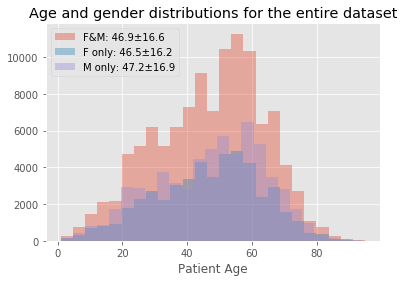

There are total 112120 cases in the dataset


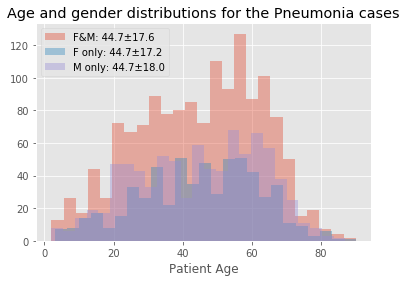

There are total 1431 Pneumonia cases in the dataset


In [14]:
# Let's look at the distribution for all patients and Pneumonia only
age_distr(final_df, name='entire dataset')
print(f'There are total {final_df.shape[0]} cases in the dataset')
age_distr(final_df[final_df.Pneumonia == 1.0], name='Pneumonia cases')
print(f'There are total {final_df[final_df.Pneumonia == 1.0].shape[0]} Pneumonia cases in the dataset')

In [15]:
display(final_df['Patient Age'].describe())

count    112120.000000
mean         46.872958
std          16.597918
min           1.000000
25%          35.000000
50%          49.000000
75%          59.000000
max          95.000000
Name: Patient Age, dtype: float64

In [13]:
def gender_hist(df, name='entire dataset'):
    '''
    this funtion plot gender histogram of patients represented in the df dataset. 
    df: dataset with the 'Patient Gender' - gender colunm (string, F or M) and 'Pneumonia' - column 'Pneumonia' (1 or 0)
    name: title for the disease gender collection
    '''
    # count F and M
    m_counts, f_counts = df['Patient Gender'].value_counts()
    plt.figure(figsize=(6,6))
    df['Patient Gender'].value_counts().plot(kind='bar', color='b', alpha=0.7)
    plt.text(0.4, int(max(m_counts, f_counts)*0.95), f'Male/Female ratio is {m_counts/f_counts:.2f}', fontsize=14)
    plt.title(f'Patient gender histogram for the {name}')
    plt.show()

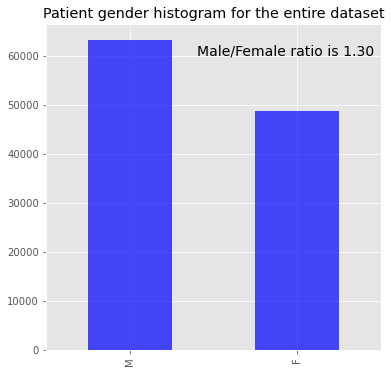

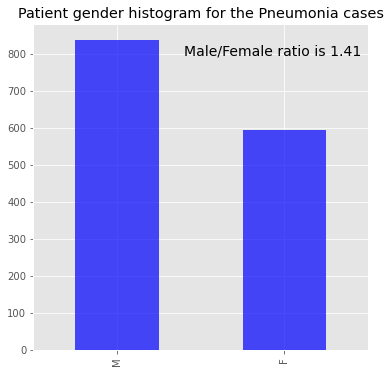

In [14]:
# Let's look at the gender histograms for all patients and Pneumonia only
gender_hist(final_df, name='entire dataset')
gender_hist(final_df[final_df.Pneumonia == 1.0], name='Pneumonia cases')

### Base on the age distributions above, we can conclude that age distributions are similar for both genders with mean around 47 years old with STD or 17 years. Therefore, the gender histogram shows that there are more male cases in the entire dataset. There are 1431 cases of Pneumonia in the dataset. The age mean for those patients is 44.7 years and STD is around 17.6 years. The age distributions for different genders and gender histogram for positive Pneumonia looks similar to the entire dataset. Thus, we can conclude that 95% of patients are in the range of 13 to 81 years old, and this would be one of the limitations for the algorithm usage. We may ignore the difference in Male and Female histogram due to the goal is to detect Pneumonia and we can assume that the disease will appear similarly on the images, therefore, the x-rays images with no findings may be slightly different for different genders.

# The x-ray views taken analysis

### Let's look at the Positioning. 

Here is a useful information about the differences on how chest X-rays are taken [Ref](https://www.med-ed.virginia.edu/courses/rad/cxr/technique3chest.html#:~:text=The%20heart%20shadow%20is%20magnified%20because%20it%20is%20an%20anterior%20structure.&text=The%20AP%20shows%20magnification%20of,patients%20who%20cannot%20stand%20erect.): 

The PA (posterioranterior) film is obtained with the patient facing the cassette and the x-ray tube 6 feet away. This distance diminishes the effect of beam divergence and magnification of structures closer to the x-ray tube. On the film below the exam was obtained in an AP or anteroposterior position. Note that the chest has a difference appearance. The heart shadow is magnified because it is an anterior structure. The pulmonary vasculature is also altered when patients are examined in the supine position.  On the AP supine film there is more equalization of the pulmonary vasculature when the size of the lower lobe vessels are compared to the upper.

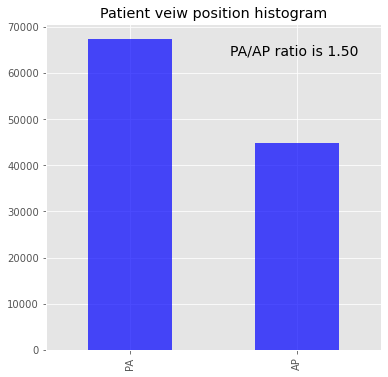

In [15]:
pa_counts, ap_counts = final_df['View Position'].value_counts()
plt.figure(figsize=(6,6))
final_df['View Position'].value_counts().plot(kind='bar', color='b', alpha=0.7)
plt.text(0.6, int(max(pa_counts, ap_counts)*0.95), f'PA/AP ratio is {pa_counts/ap_counts:.2f}', fontsize=14)
plt.title('Patient veiw position histogram')
plt.show()

### 2/3 of the images were taken in PA view. The AP images (1/3 of the dataset) have a little bit different appearance due to bigger heart shadow and altered pulmonary vasculature. It may be a minor issues due to algorithm may start learning this differences instead to look for differences in appearance due to a disease.

# The diseases distribution analysis (number of disease per patient, number of cases per disease, distribution of other diseases that are comorbid with pneumonia)

### Let's look at the histogram of the number of disease per patient

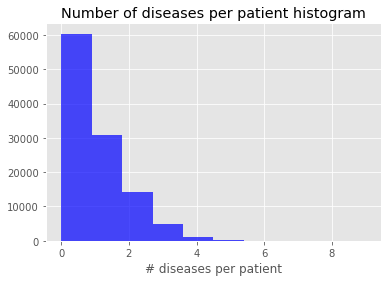

In [16]:
# remove 'No Finding' from all_labels list
disease_labels = all_labels.copy()
disease_labels.remove('No Finding')
# plot
plt.hist(final_df[disease_labels].sum(axis=1), color='b', alpha=0.7)
plt.xlabel('# diseases per patient')
plt.title('Number of diseases per patient histogram')
plt.show()

### About a half of the dataset represents cases without any findings. ~ 1/4 cases are with only one disease, around 14% have 2 diseases found on the x-rays, and ~3% represent cases with 3 identified diseases.

### Let's look into diseases distributions presented in the dataset in terms of frequency and co-occurrence with one another.

,count,mean,std,min,25%,50%,75%,max
No Finding,112120.0,0.538361,0.498529,0.0,0.0,1.0,1.0,1.0
Infiltration,112120.0,0.177435,0.382038,0.0,0.0,0.0,0.0,1.0
Effusion,112120.0,0.118775,0.323524,0.0,0.0,0.0,0.0,1.0
Atelectasis,112120.0,0.103095,0.304084,0.0,0.0,0.0,0.0,1.0
Nodule,112120.0,0.056466,0.230821,0.0,0.0,0.0,0.0,1.0
Mass,112120.0,0.051570,0.221158,0.0,0.0,0.0,0.0,1.0
Pneumothorax,112120.0,0.047289,0.212256,0.0,0.0,0.0,0.0,1.0
Consolidation,112120.0,0.041625,0.199732,0.0,0.0,0.0,0.0,1.0
Pleural_Thickening,112120.0,0.030191,0.171113,0.0,0.0,0.0,0.0,1.0
Cardiomegaly,112120.0,0.024759,0.155391,0.0,0.0,0.0,0.0,1.0



There are 112120 cases in the dataset.

There are total 15 diseases presented in the dataset. 

The top five diseases are:
['Infiltration', 'Effusion', 'Atelectasis', 'Nodule', 'Mass']

There are only 1431 pneumonia cases presented in the dataset, which is only 1.28% of the dataset.


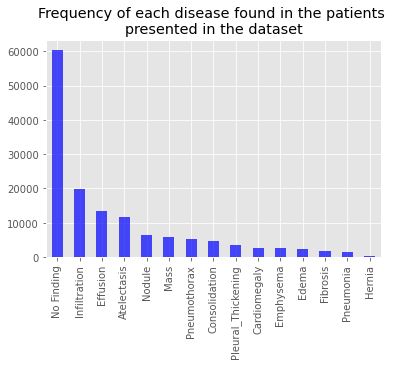

In [17]:
# Let's look at basic statistics
basic_stat_dis = final_df[all_labels].describe().T.sort_values(by='mean', ascending=False)
display(basic_stat_dis)
print(f'\nThere are {final_df.shape[0]} cases in the dataset.')
print(f'\nThere are total {len(all_labels)} diseases presented in the dataset. \n\nThe top five diseases are:\n{list(basic_stat_dis.index[1:6])}')
pneumonia_mean = basic_stat_dis['mean'].loc['Pneumonia']
print(f'\nThere are only {int(pneumonia_mean*final_df.shape[0])} pneumonia cases presented in the dataset, which is only {pneumonia_mean*100:.2f}% of the dataset.')
(basic_stat_dis['mean']*final_df.shape[0]).plot(kind='bar', color='b', alpha=0.7)
plt.title('Frequency of each disease found in the patients \npresented in the dataset')
plt.show()

### Let's access the co-occurrence of all diseases and look into pneumonia cases and what diseases are comorbid with pneumonia

In [18]:
# slice only diseases, convert to integers, sort by disease frequency, 
# calculate the co-occurrencall_labels[1:]e matrix, and visualize the result
df_asint = final_df[all_labels].astype(int)[basic_stat_dis.index]
coocc = df_asint.T.dot(df_asint)
coocc.style.set_properties(**{'font-size':'6pt'}).background_gradient('plasma')

,No Finding,Infiltration,Effusion,Atelectasis,Nodule,Mass,Pneumothorax,Consolidation,Pleural_Thickening,Cardiomegaly,Emphysema,Edema,Fibrosis,Pneumonia,Hernia
No Finding,60361,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Infiltration,0,19894,4000,3264,1546,1159,946,1221,750,587,449,981,345,605,33
Effusion,0,4000,13317,3275,912,1254,996,1287,849,1063,359,593,188,269,21
Atelectasis,0,3264,3275,11559,590,739,774,1223,496,370,424,221,220,262,40
Nodule,0,1546,912,590,6331,906,341,428,411,108,115,131,166,70,10
Mass,0,1159,1254,739,906,5782,431,610,452,102,215,129,117,71,25
Pneumothorax,0,946,996,774,341,431,5302,223,289,49,747,33,80,41,9
Consolidation,0,1221,1287,1223,428,610,223,4667,251,169,103,162,79,123,4
Pleural_Thickening,0,750,849,496,411,452,289,251,3385,111,151,64,176,48,8
Cardiomegaly,0,587,1063,370,108,102,49,169,111,2776,44,127,52,41,7


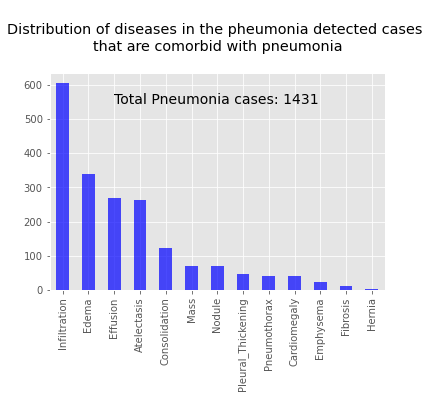


The top five diseases comorbid with pneumonia are:
['Infiltration', 'Edema', 'Effusion', 'Atelectasis', 'Consolidation']


In [19]:
comorbid_pneumonia_ds = coocc.sort_values(by='Pneumonia', ascending=False)['Pneumonia']
comorbid_pneumonia_ds.loc[comorbid_pneumonia_ds.index[1:-1]].plot(kind='bar', color='b', alpha=0.7)
plt.title('\nDistribution of diseases in the pheumonia detected cases \nthat are comorbid with pneumonia\n')
plt.text(2, int(max(comorbid_pneumonia_ds.loc[comorbid_pneumonia_ds.index[1:-1]])*0.9), f'Total Pneumonia cases: {comorbid_pneumonia_ds.loc["Pneumonia"]}', fontsize=14)
plt.show()
print(f'\nThe top five diseases comorbid with pneumonia are:\n{list(comorbid_pneumonia_ds.index[1:6])}')

### It might be interesting to note that Infiltration, Effusion, and Atelectasis are the most frequent diseases in the dataset, therefore the Edema and Consolidation with those 3 diseases are in the top five diseases comorbid with Pheumonia.

# Pixel-level assessments of the imaging data for healthy & disease states of interest (e.g. histograms of intensity values) and compare distributions across diseases. 

In [20]:
plt.style.use('default')
sample_xray_df = pd.read_csv('sample_labels.csv')
sample_xray_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5606 entries, 0 to 5605
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Image Index                  5606 non-null   object 
 1   Finding Labels               5606 non-null   object 
 2   Follow-up #                  5606 non-null   int64  
 3   Patient ID                   5606 non-null   int64  
 4   Patient Age                  5606 non-null   object 
 5   Patient Gender               5606 non-null   object 
 6   View Position                5606 non-null   object 
 7   OriginalImageWidth           5606 non-null   int64  
 8   OriginalImageHeight          5606 non-null   int64  
 9   OriginalImagePixelSpacing_x  5606 non-null   float64
 10  OriginalImagePixelSpacing_y  5606 non-null   float64
dtypes: float64(2), int64(4), object(5)
memory usage: 481.9+ KB


In [21]:
# Split 'Finding Labels' column into one additional column per disease (one hot encoding)
# this is suppose to be a subset of the datased analyzed above
for c_label in all_labels:
    if len(c_label)>1: # leave out empty labels
        sample_xray_df[c_label] = sample_xray_df['Finding Labels'].map(lambda finding: 1.0 if c_label in finding else 0)
sample_xray_df.sample(5)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Emphysema,Fibrosis,Hernia,Infiltration,Mass,No Finding,Nodule,Pleural_Thickening,Pneumonia,Pneumothorax
4251,00020960_004.png,No Finding,4,20960,056Y,M,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4778,00025109_003.png,No Finding,3,25109,039Y,F,AP,3056,2544,0.139,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3339,00016497_001.png,No Finding,1,16497,064Y,F,AP,2500,2048,0.168,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1450,00007526_022.png,No Finding,22,7526,065Y,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2298,00011731_006.png,Infiltration,6,11731,038Y,F,AP,3056,2544,0.139,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
# check if all image names are unique
sample_xray_df['Image Index'].unique().shape[0] == sample_xray_df['Image Index'].shape[0]

True

In [23]:
# create image_path column with full path to the image
# online
#sample_xray_df['image_path'] = sample_xray_df['Image Index'].apply(lambda x : glob(os.path.join('/data','images*','*', x))[0])
# at home
sample_xray_df['image_path'] = sample_xray_df['Image Index'].apply(lambda x : glob(os.path.join('/mnt/data/Datasets/chestxray/NIH_chest_xrays','/data','images*','*', x))[0])
sample_xray_df['image_path'] 

0       /data/images_001/images/00000013_005.png
1       /data/images_001/images/00000013_026.png
2       /data/images_001/images/00000017_001.png
3       /data/images_001/images/00000030_001.png
4       /data/images_001/images/00000032_001.png
                          ...                   
5601    /data/images_012/images/00030712_000.png
5602    /data/images_012/images/00030786_005.png
5603    /data/images_012/images/00030789_000.png
5604    /data/images_012/images/00030792_000.png
5605    /data/images_012/images/00030797_000.png
Name: image_path, Length: 5606, dtype: object

### Let's visualize some examples of X-Rays for all diseases (pure, without any other diseases) represented in the sample dataset

In [24]:
dic_unique_dis = {} 
for c_label in all_labels:
    tmp_rest = all_labels.copy()
    tmp_rest.remove(c_label)
    tmp_df = sample_xray_df[(sample_xray_df[c_label] == 1) & (sample_xray_df[tmp_rest].sum(axis=1) == 0)]
    if tmp_df.shape[0] == 0:
        print(f'There is no cases where {c_label} wihtout presence of the other diseases')
    dic_unique_dis[c_label] = tmp_df.copy()

In [25]:
# random pick up n rando X-Rays images for each disease and show them up
def show_n_rand_img(df_tmp, name_dis, n=3):
    '''
    this function visualize 3 images from a dataframe
    dt_tmp is a dataframe, name_dis - string comtained disease type
    n is an interger and represents how many random images to show
    'image_path' column must be presented in the dataframe to show the images
    '''
    df_n = df_tmp.sample(n=n, random_state=1)
    imgs = [imread(img_tmp_path) for img_tmp_path in df_n.image_path]
    plt.figure(figsize=(n*3, 3))
    for img_tmp_ind in range(n):
        plt.subplot(1,n,img_tmp_ind+1)
        plt.imshow(imgs[img_tmp_ind], cmap='gray')
        plt.axis('off')
        plt.suptitle(f'{name_dis}', fontsize=14)
    plt.show()

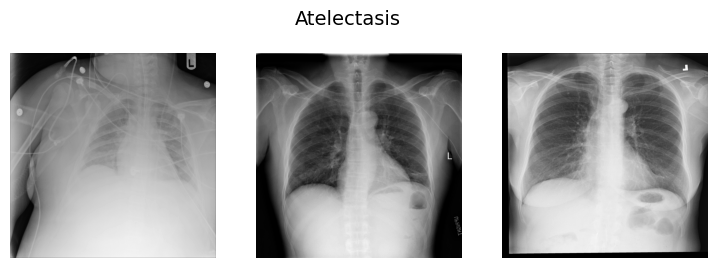

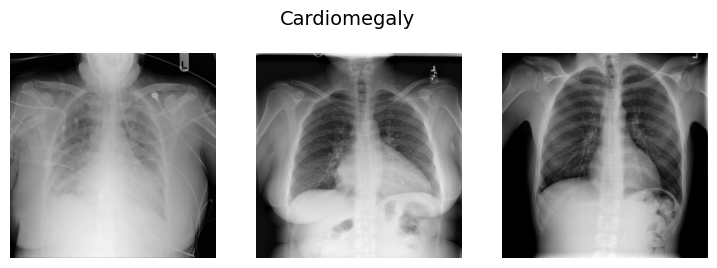

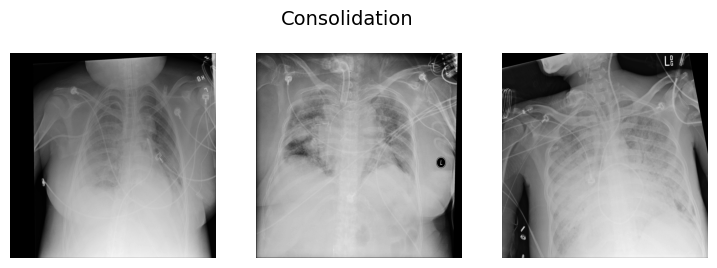

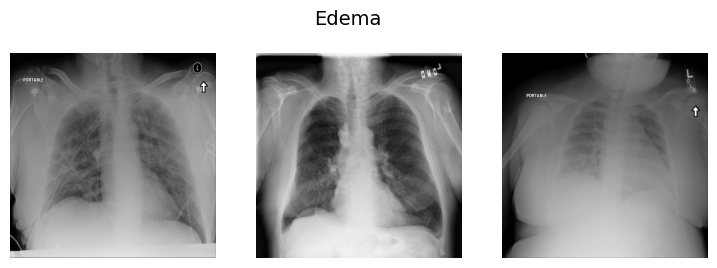

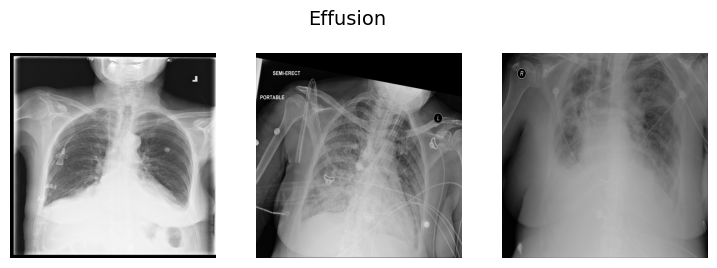

...

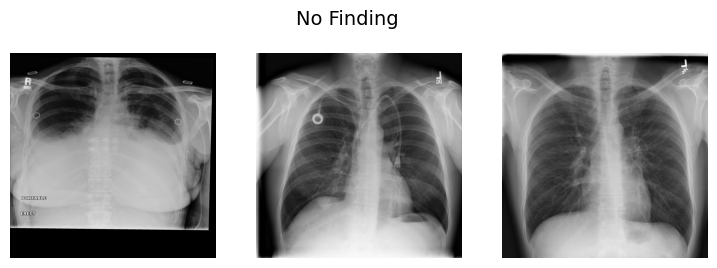

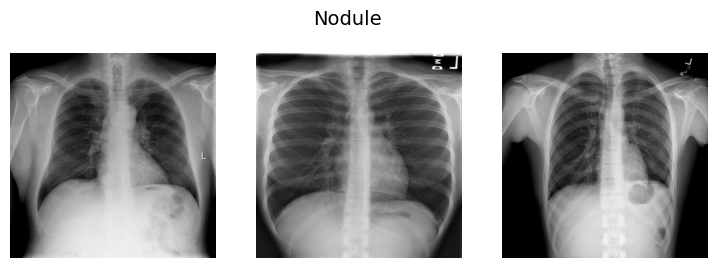

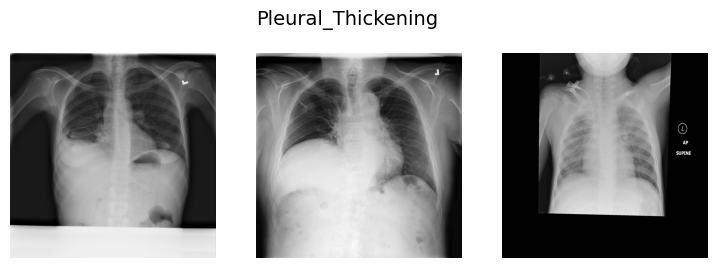

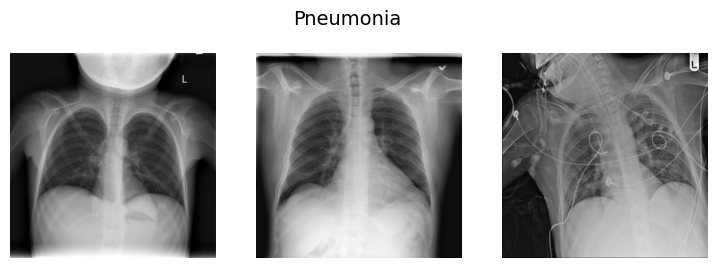

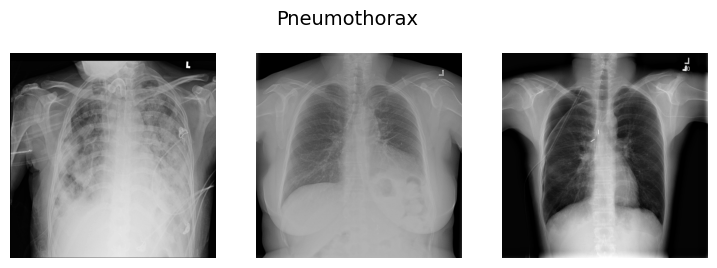

In [26]:
for label_tmp, df_tmp in dic_unique_dis.items():
    show_n_rand_img(df_tmp, label_tmp, 3)

### Base on the representative X-Ray images we can conclude that it would be very difficult for non-trained person to identify a particular disease. Also, it is easy to distinguish a gender, thus the algorithm may be able to learn it, which may not be good. We have to be careful during splitting dataset and make sure that the Female/Male ratio is balanced in training/validation/test datasets.

### Let's compare distributions of intensity values of the pixel-level data within 'Pneumonia' cases

In [27]:
def n_rand_img_dist(df_tmp, name_dis, n=3, thr=5.):
    '''
    this function visualize 3 images from a dataframe
    dt_tmp is a dataframe, name_dis - string comtained disease type
    n is an interger and represents how many random images to show
    'image_path' column must be presented in the dataframe to show the images
    return images and distribution of the pixel intensities raw and normalized
    a threshold of 5 is automatically applied and can be changed with parameter 'thr'
    '''
    df_n = df_tmp.sample(n=n, random_state=1)
    imgs = [imread(img_tmp_path) for img_tmp_path in df_n.image_path]
    plt.figure(figsize=(n*3, 3))
    
    # Visualize images
    for img_tmp_ind in range(n):
        plt.subplot(1,n,img_tmp_ind+1)
        plt.imshow(imgs[img_tmp_ind], cmap='gray')
        plt.axis('off')
        plt.suptitle(f'{name_dis}', fontsize=14)
    plt.show()
    
    plt.figure(figsize=(n*3, 6))
    # Plot a histogram of the image pixel intensity values
    plt.subplot(1,2,1)
    plt.title(f'Distribution of the original image pixel intensity values')
    for img_tmp_ind in range(n):
        plt.hist(imgs[img_tmp_ind][imgs[img_tmp_ind] >= thr].flatten(), bins = 256, alpha=0.4, label=f'Pneumonia {img_tmp_ind+1}')
    
    # Re-plot a histogram of the normalized intensity values 
    plt.subplot(1,2,2)
    plt.title(f'Distribution of the normalized image pixel intensity values')
    mean_ls = []
    median_ls = []
    for img_tmp_ind in range(n):
        img_tmp_array = imgs[img_tmp_ind][imgs[img_tmp_ind] >= thr].flatten()
        mean_tmp = np.mean(img_tmp_array)
        mean_ls.append(mean_tmp.round(1))
        median_tmp = np.median(img_tmp_array)
        median_ls.append(median_tmp.round(1))
        std_tmp = np.std(img_tmp_array)
        img_tmp_norm = (img_tmp_array - mean_tmp) / std_tmp    
        plt.hist(img_tmp_norm, bins = 256, alpha=0.4, label=f'Pneumonia {img_tmp_ind+1}')
    plt.legend(loc=0)
    plt.show()
    print(f'Threshold = {thr}')
    print('Mean values:', mean_ls)
    print('Median values:', median_ls)

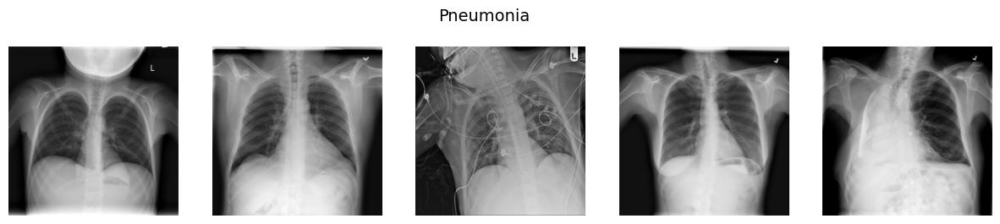

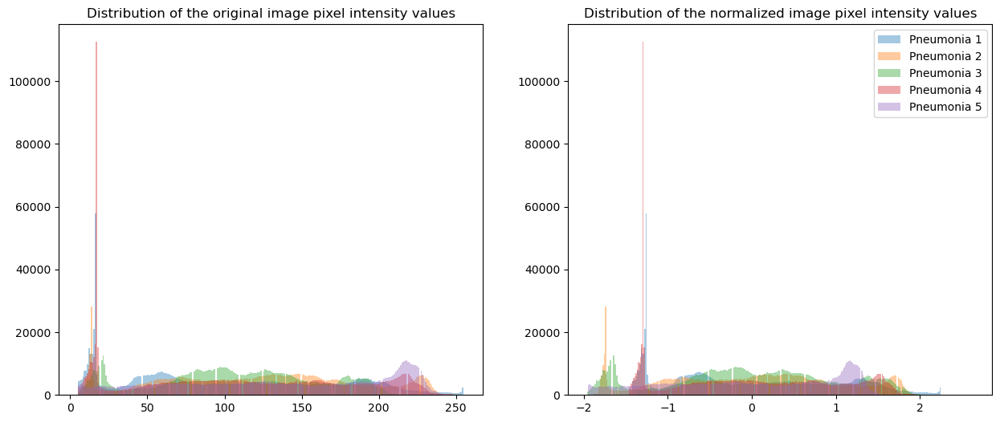

Threshold = 5
Mean values: [101.8, 122.0, 107.4, 109.1, 138.0]
Median values: [93.0, 125.0, 107.0, 107.0, 143.0]


In [28]:
# will pick up 5 random images, show thenm, and check intensities distributions
n_rand_img_dist(dic_unique_dis['Pneumonia'], 'Pneumonia', 5, 5)

### It looks like there are a lot of pixels with the intensities below 20. Let's plot histograms for the same images but apply a threshold of 20 before any calculations. 

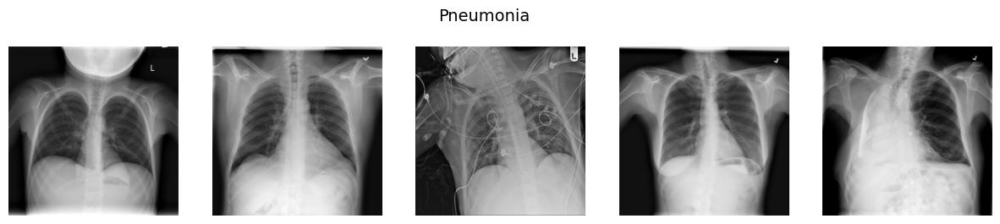

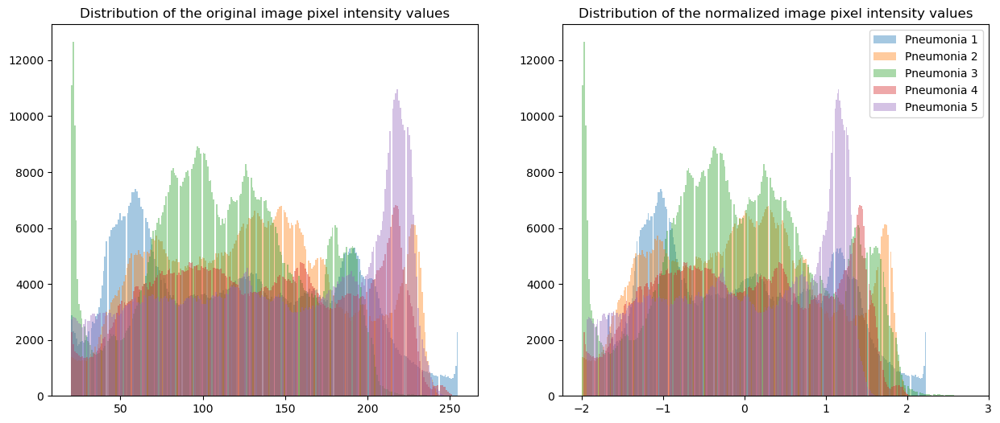

Threshold = 20
Mean values: [120.7, 131.1, 114.3, 134.5, 143.8]
Median values: [118.0, 131.0, 113.0, 134.0, 149.0]


In [29]:
n_rand_img_dist(dic_unique_dis['Pneumonia'], 'Pneumonia', 5, 20)

### Here we can see that the pixel intensities distributions looks slightly different, but the mean and median values of the distributions are similar within each image. 

### Let's compare distributions of intensity values of the pixel-level data across diagnoses
* plot all distributions without applying a threshold
* plot all distributions with a threshold of 20
* average all images and plot all distributions of the averaged images 

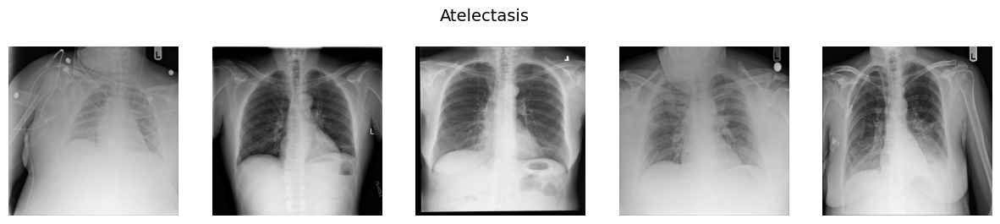

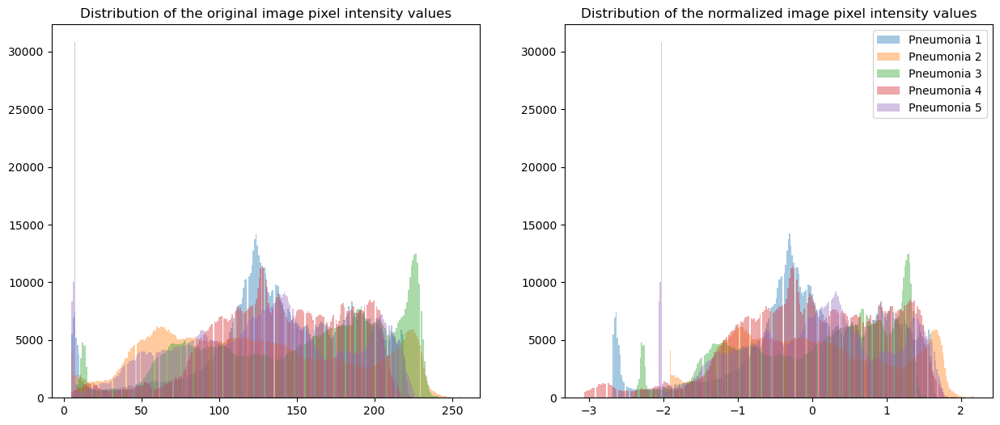

Threshold = 5
Mean values: [139.0, 122.4, 149.1, 139.3, 123.7]
Median values: [139.0, 117.0, 161.0, 140.0, 129.0]


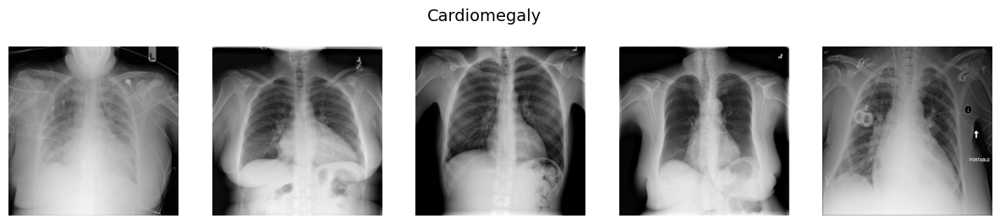

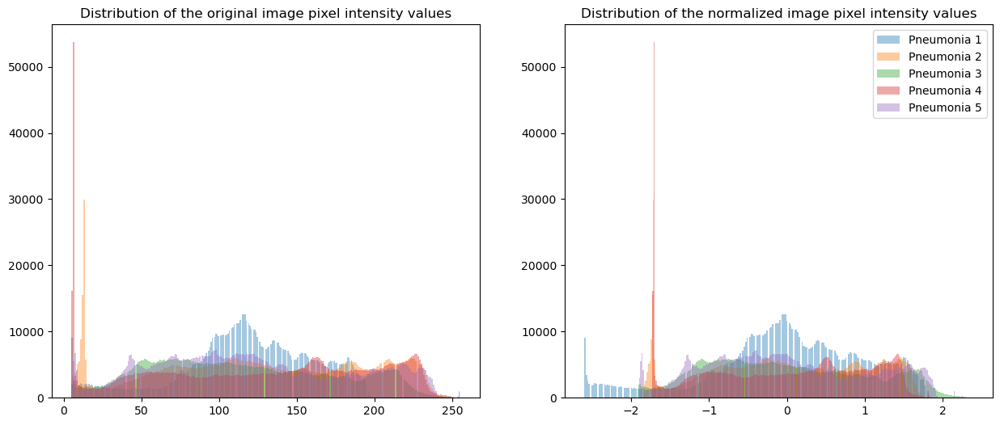

Threshold = 5
Mean values: [117.8, 126.7, 115.7, 126.7, 122.2]
Median values: [119.0, 126.0, 109.0, 135.0, 115.0]


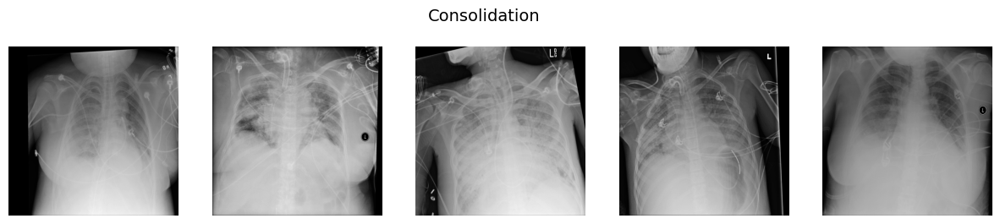

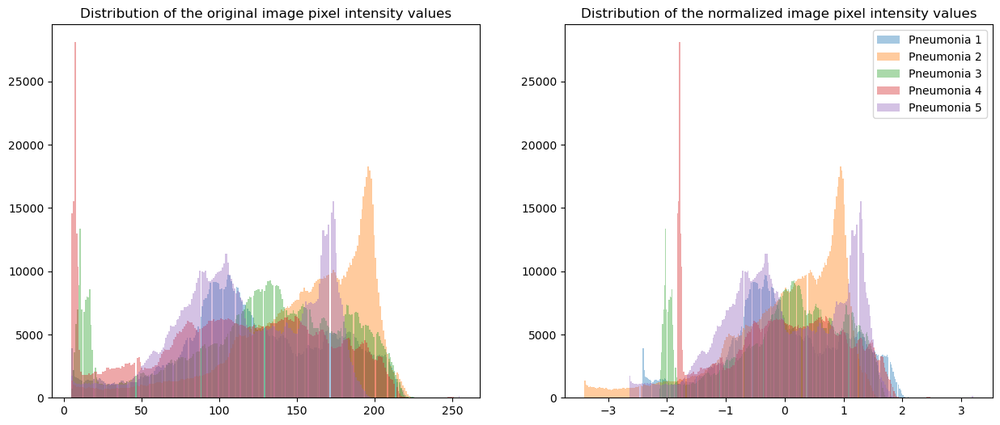

Threshold = 5
Mean values: [122.3, 154.4, 124.1, 109.4, 118.1]
Median values: [117.0, 164.0, 132.0, 113.0, 114.0]


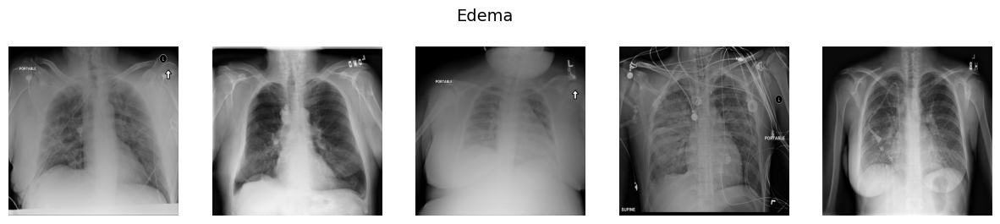

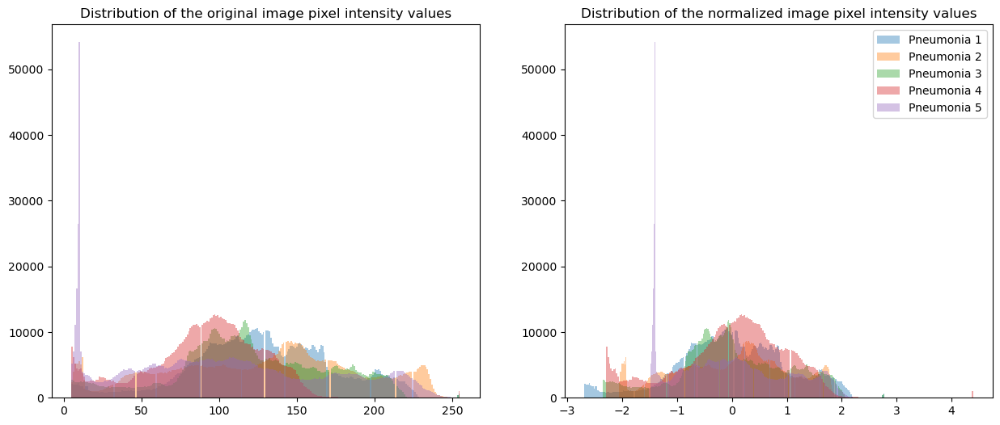

Threshold = 5
Mean values: [128.0, 128.4, 119.8, 90.8, 103.4]
Median values: [127.0, 135.0, 116.0, 95.0, 99.0]


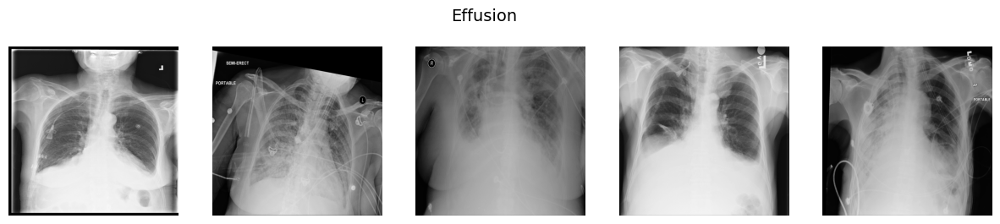

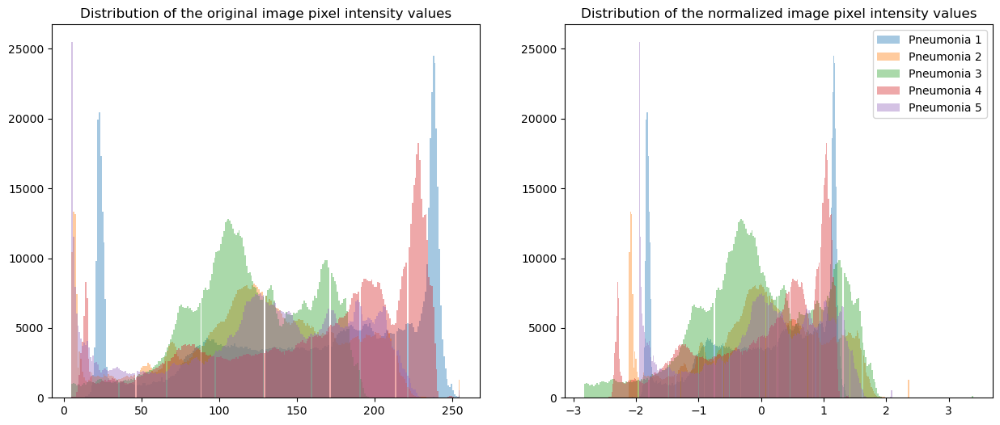

Threshold = 5
Mean values: [154.2, 123.0, 118.8, 161.2, 125.7]
Median values: [169.0, 126.0, 116.0, 181.0, 134.0]


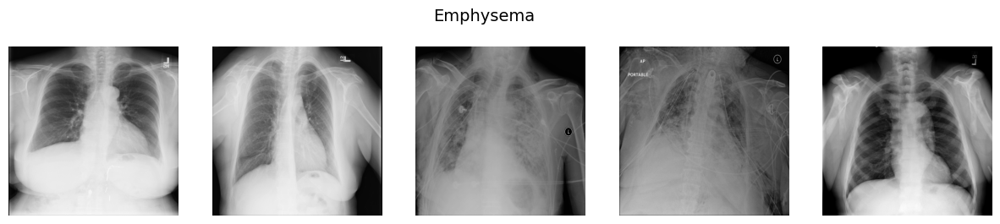

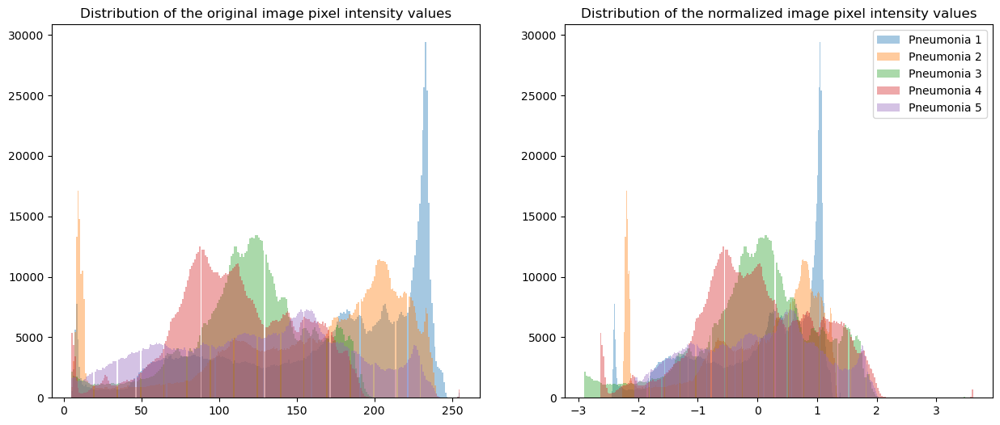

Threshold = 5
Mean values: [164.4, 153.0, 118.7, 110.5, 124.3]
Median values: [183.0, 173.0, 121.0, 108.0, 128.0]


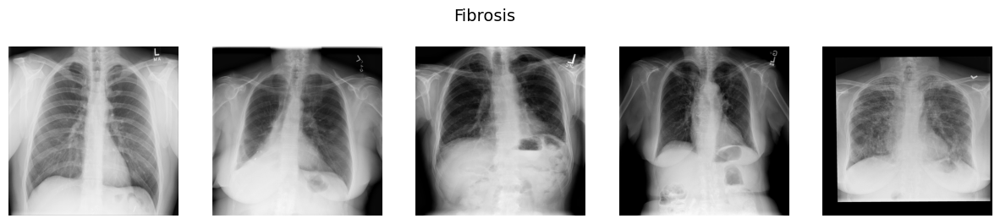

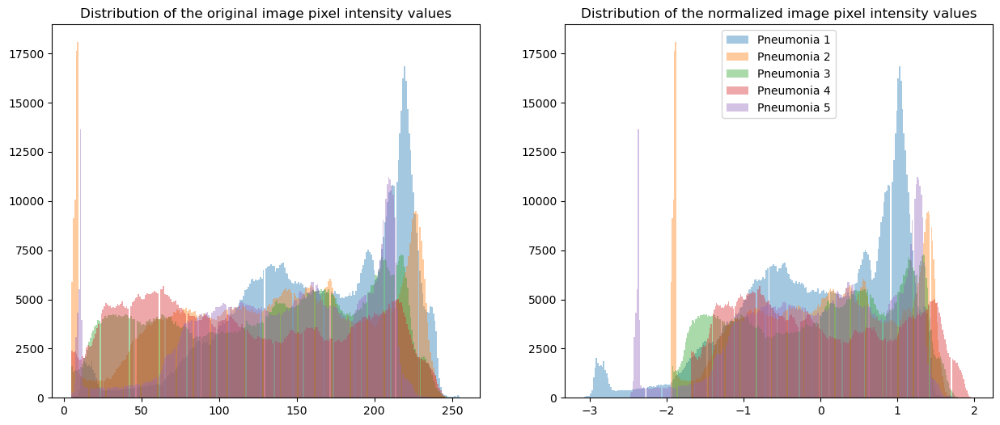

Threshold = 5
Mean values: [165.5, 133.9, 130.5, 116.7, 140.3]
Median values: [173.0, 139.0, 139.0, 109.0, 146.0]


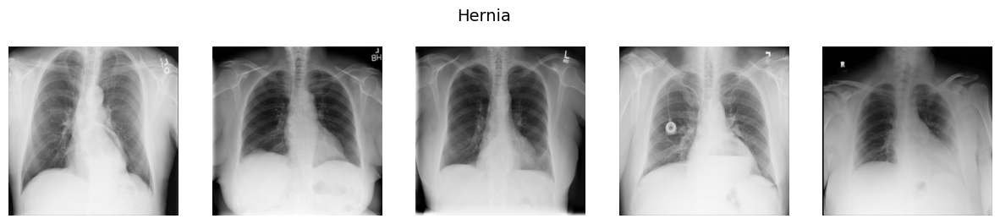

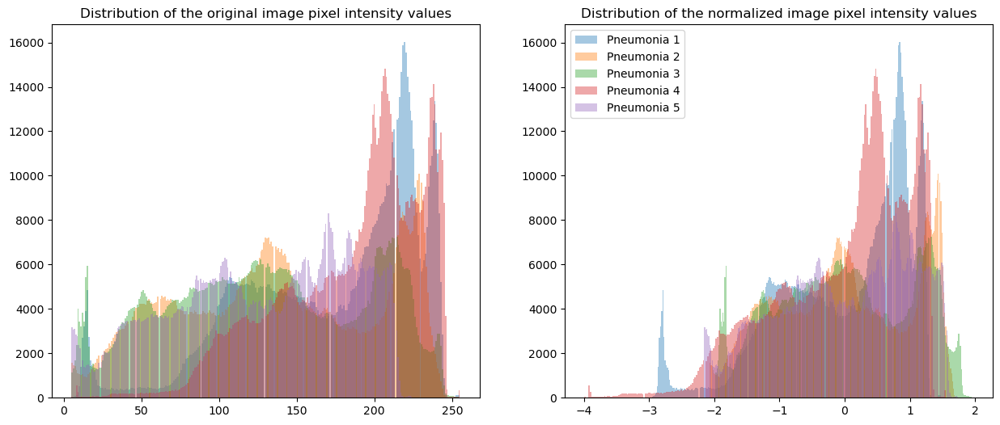

Threshold = 5
Mean values: [171.9, 137.1, 130.4, 185.2, 126.2]
Median values: [189.0, 136.0, 130.0, 198.0, 131.0]


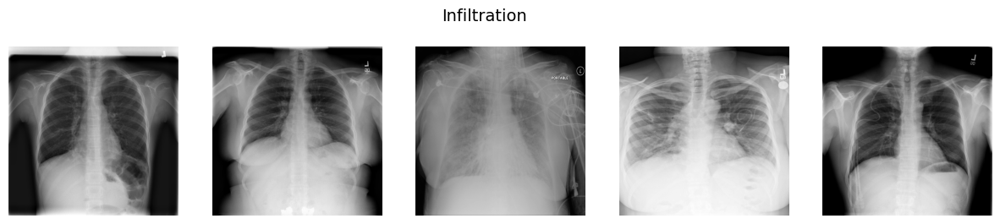

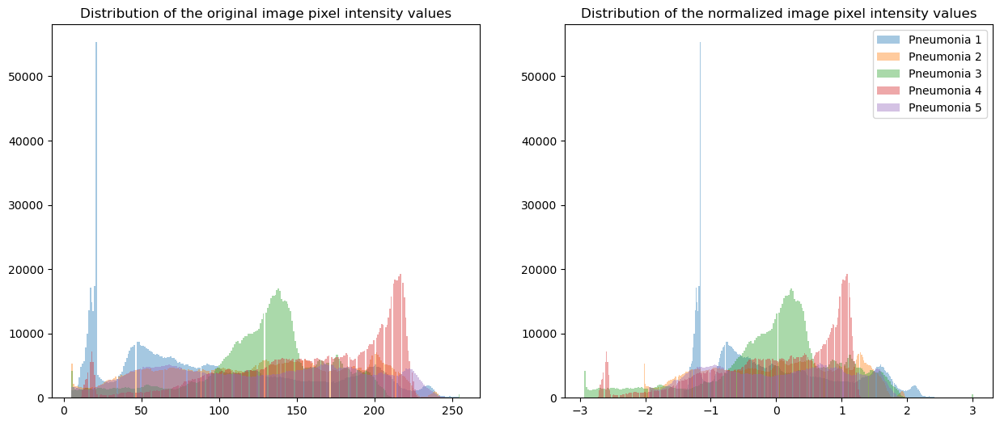

Threshold = 5
Mean values: [96.8, 125.0, 128.5, 158.2, 126.1]
Median values: [83.0, 129.0, 134.0, 170.0, 128.0]


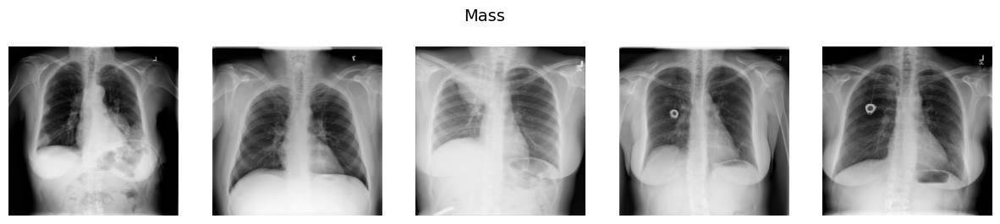

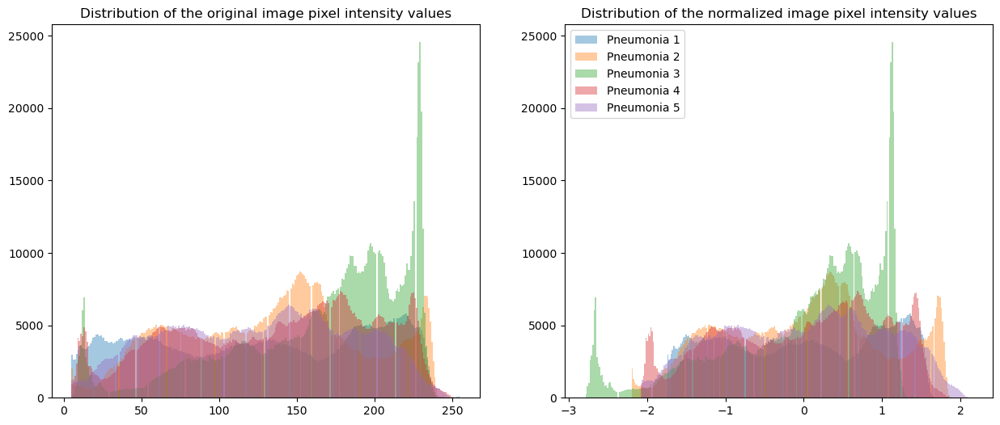

Threshold = 5
Mean values: [126.0, 132.9, 164.8, 135.4, 126.4]
Median values: [128.0, 138.0, 181.0, 145.0, 131.0]


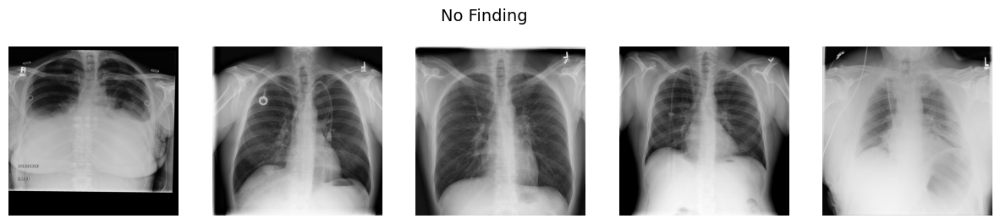

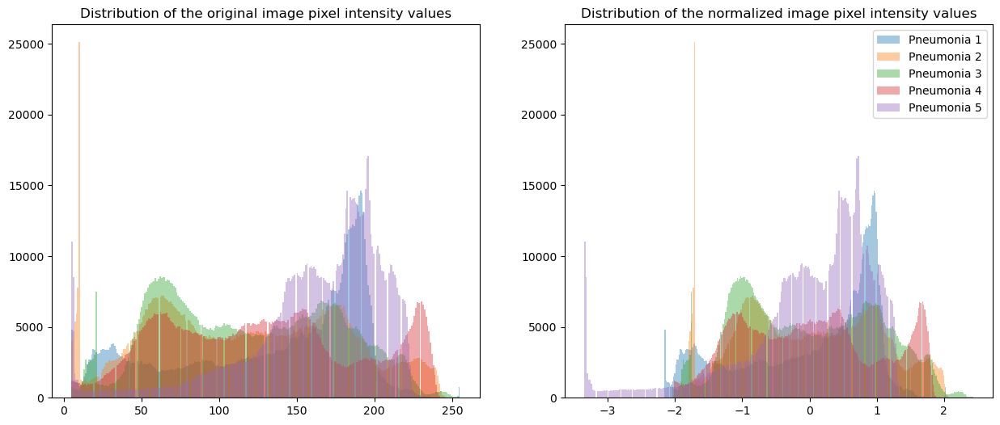

Threshold = 5
Mean values: [133.7, 116.8, 119.2, 127.9, 162.0]
Median values: [154.0, 116.0, 116.0, 126.0, 174.0]


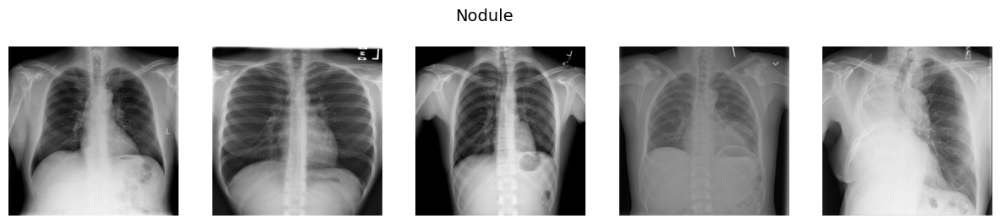

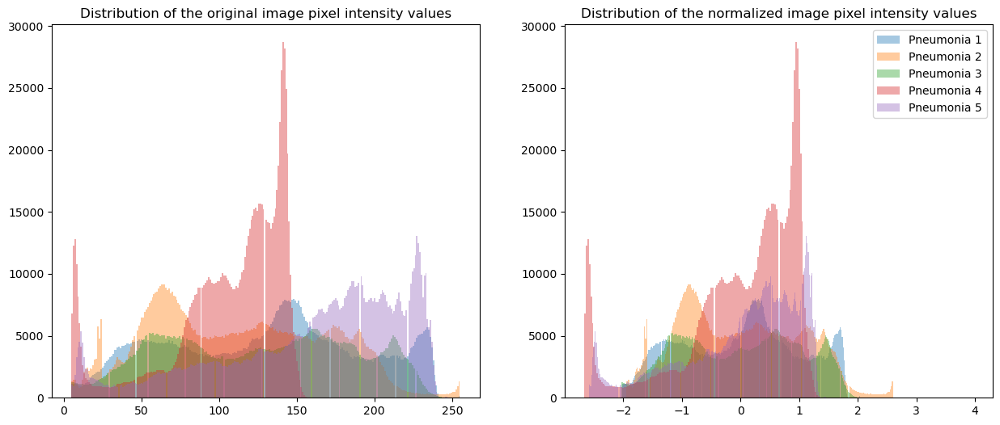

Threshold = 5
Mean values: [129.2, 112.0, 125.8, 105.5, 159.9]
Median values: [136.0, 109.0, 129.0, 117.0, 175.0]


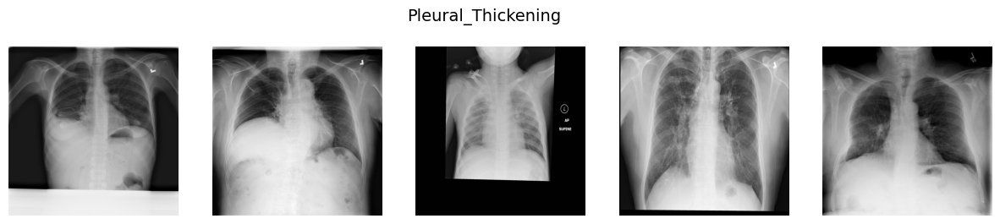

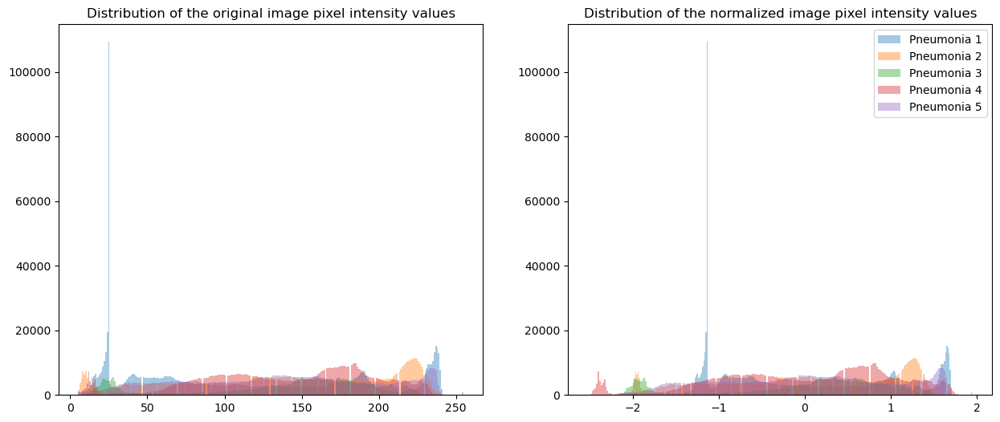

Threshold = 5
Mean values: [111.3, 138.6, 139.0, 140.9, 135.7]
Median values: [95.0, 143.0, 155.0, 148.0, 138.0]


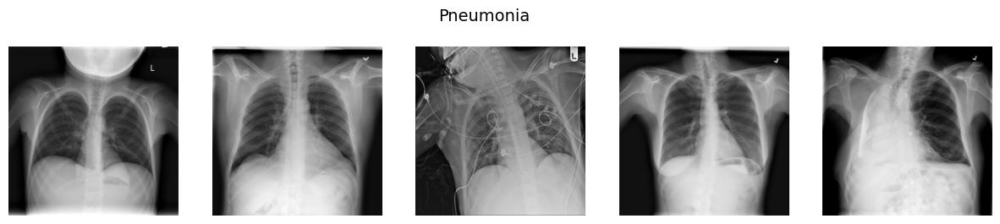

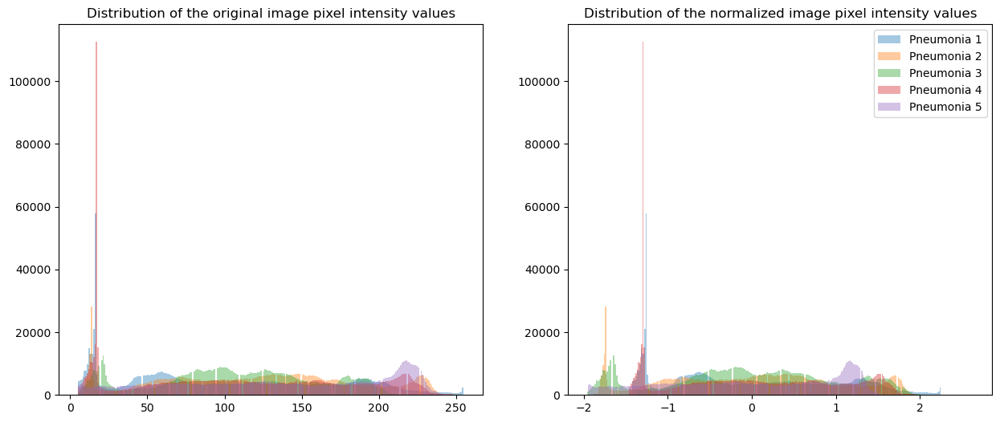

Threshold = 5
Mean values: [101.8, 122.0, 107.4, 109.1, 138.0]
Median values: [93.0, 125.0, 107.0, 107.0, 143.0]


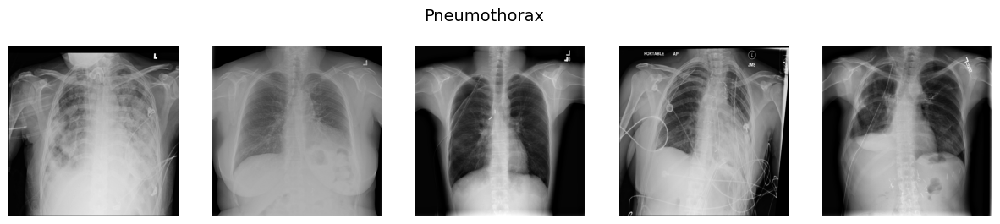

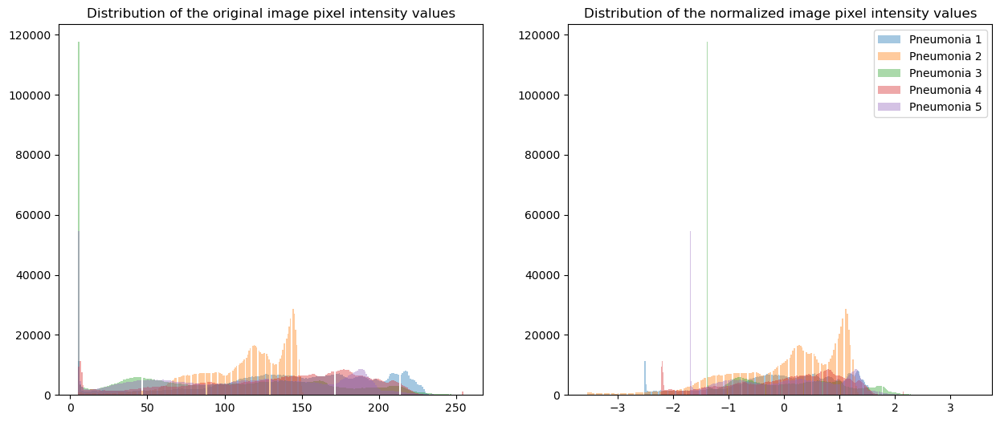

Threshold = 5
Mean values: [143.8, 111.0, 96.5, 131.9, 108.9]
Median values: [149.0, 118.0, 93.0, 143.0, 113.0]


In [30]:
# plot all distributions without applying a threshold
for label_tmp, df_tmp in dic_unique_dis.items():
    n_rand_img_dist(df_tmp, label_tmp, 5, 5)

### It looks like the distributions for different diseases looks different. Let's apply threshold to see them in details

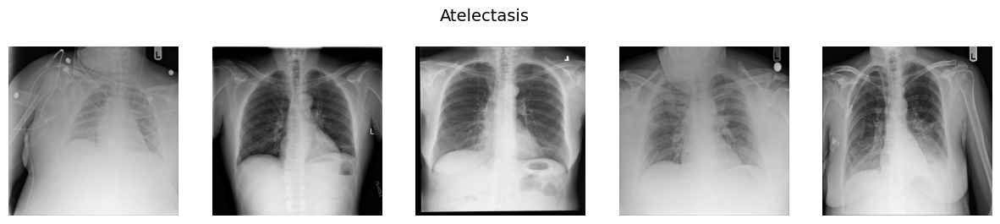

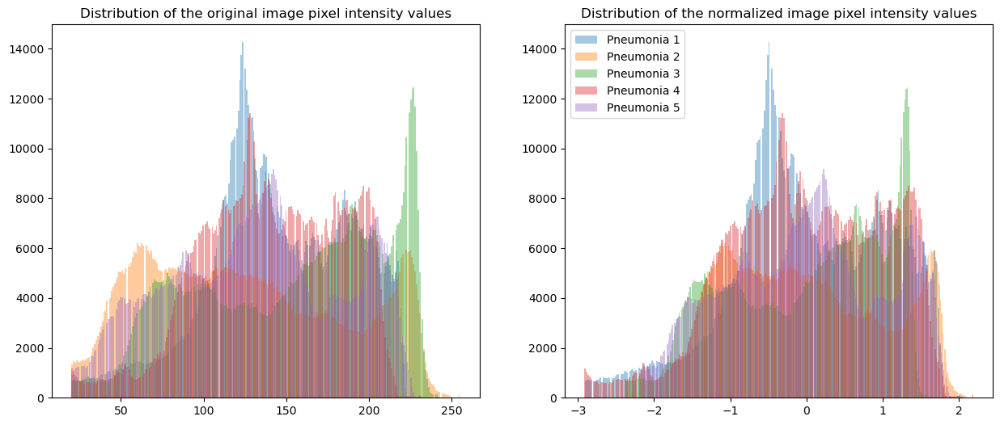

Threshold = 20
Mean values: [144.7, 125.8, 153.1, 141.1, 130.6]
Median values: [141.0, 119.0, 164.0, 141.0, 132.0]


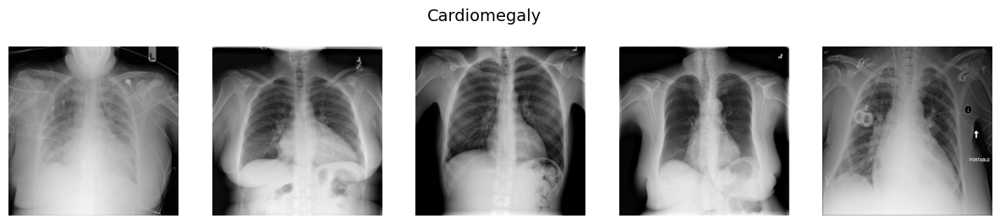

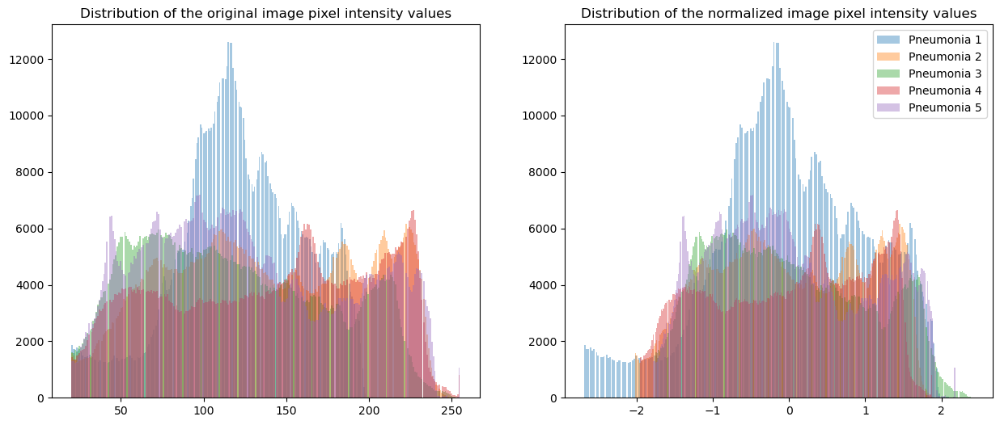

Threshold = 20
Mean values: [122.4, 138.0, 118.5, 139.8, 125.9]
Median values: [121.0, 135.0, 112.0, 147.0, 118.0]


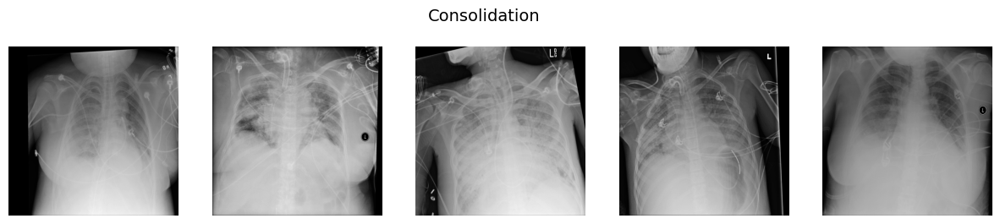

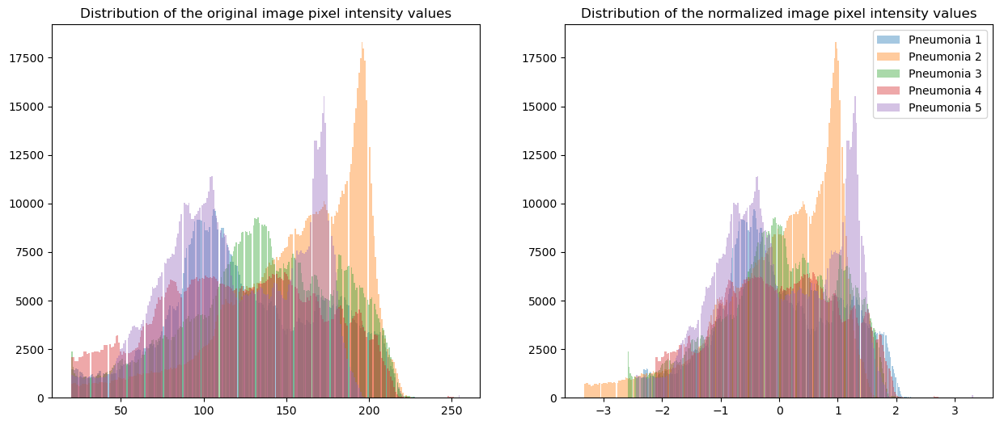

Threshold = 20
Mean values: [125.6, 156.3, 135.9, 121.4, 119.9]
Median values: [119.0, 165.0, 137.0, 122.0, 115.0]


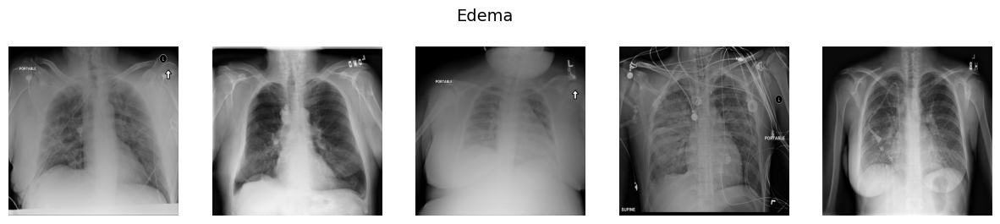

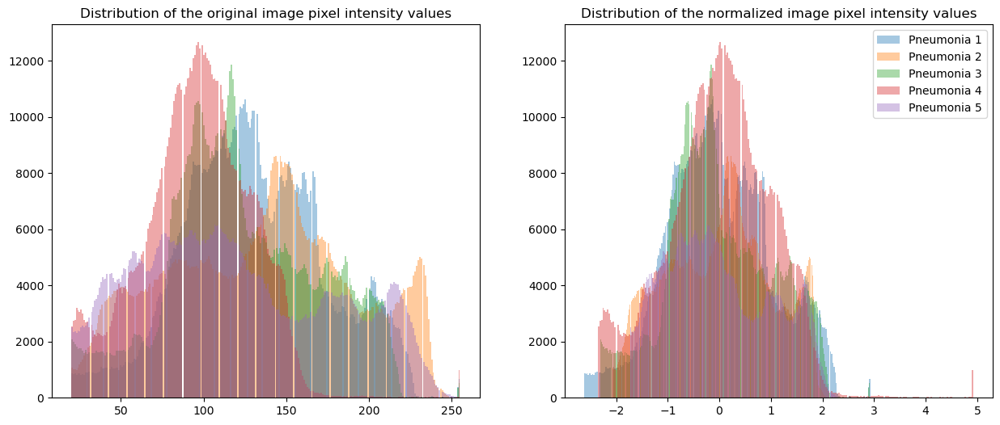

Threshold = 20
Mean values: [130.9, 134.3, 123.9, 96.0, 119.8]
Median values: [128.0, 139.0, 118.0, 97.0, 112.0]


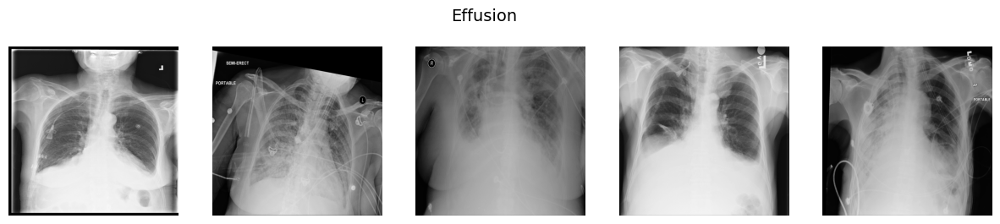

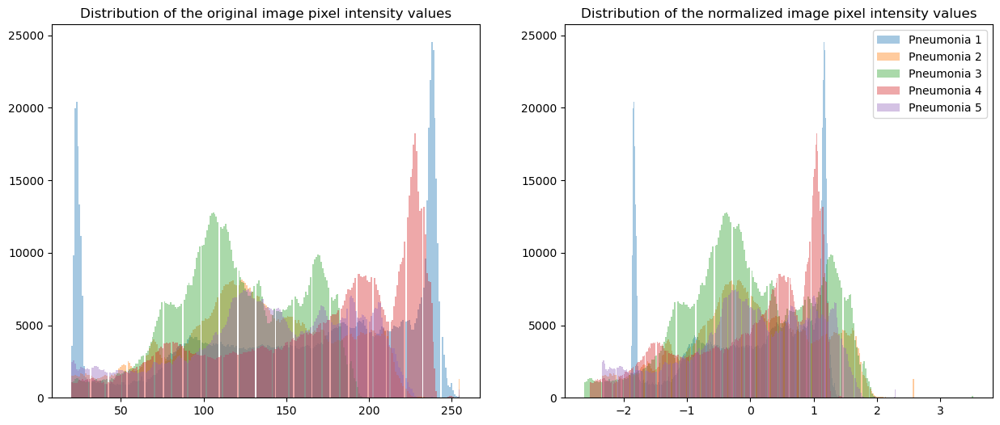

Threshold = 20
Mean values: [154.7, 131.7, 120.4, 167.0, 138.6]
Median values: [169.0, 130.0, 117.0, 184.0, 141.0]


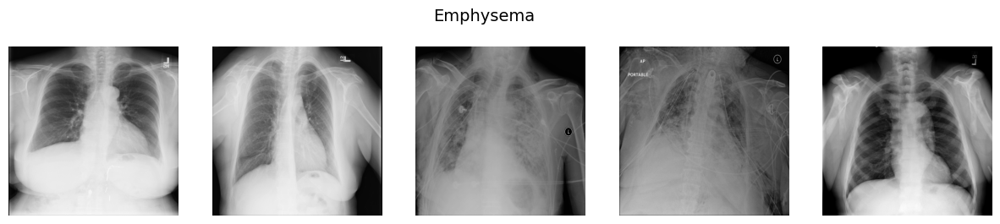

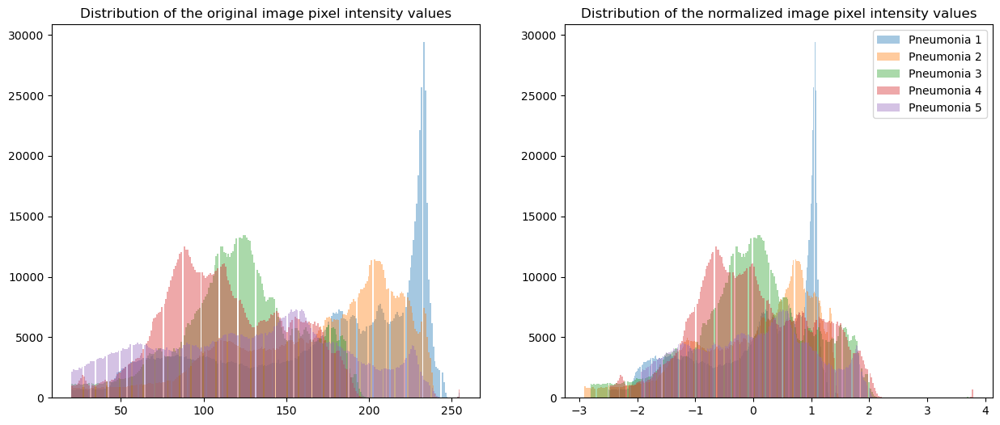

Threshold = 20
Mean values: [169.4, 166.7, 121.2, 112.6, 127.4]
Median values: [185.0, 179.0, 122.0, 109.0, 131.0]


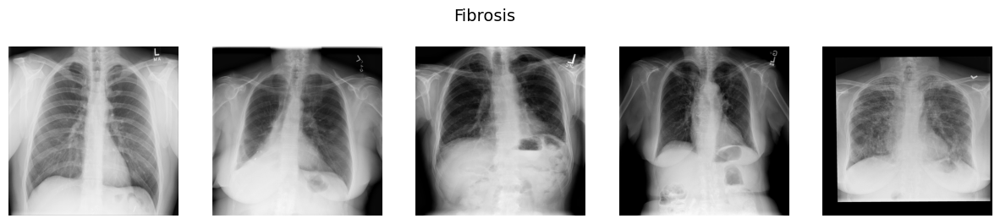

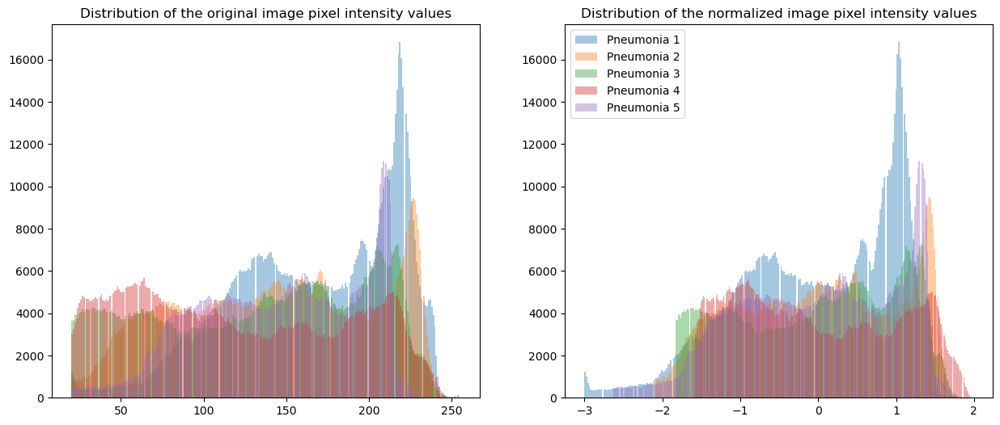

Threshold = 20
Mean values: [167.7, 143.3, 134.4, 121.0, 146.2]
Median values: [174.0, 146.0, 142.0, 113.0, 150.0]


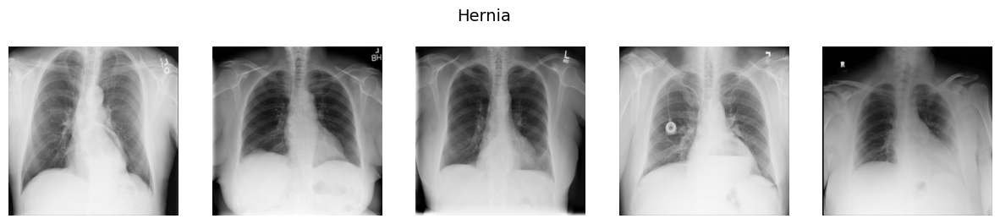

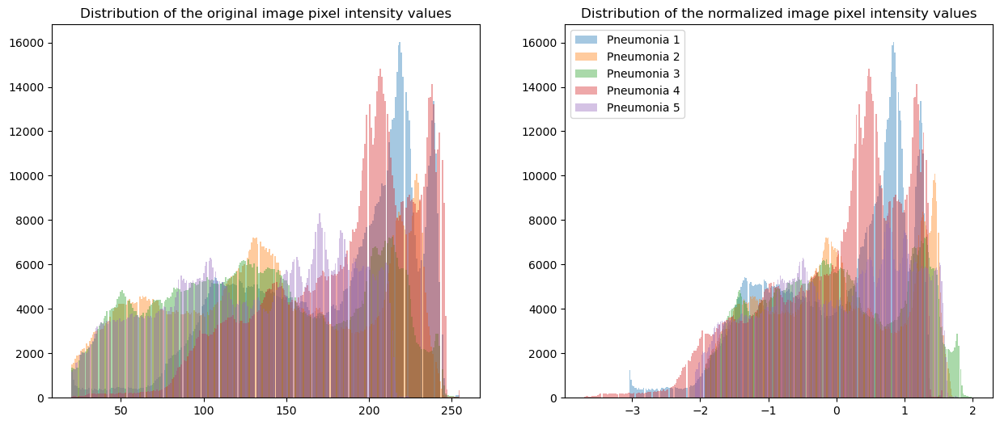

Threshold = 20
Mean values: [175.6, 139.4, 135.5, 185.4, 130.1]
Median values: [192.0, 137.0, 133.0, 198.0, 135.0]


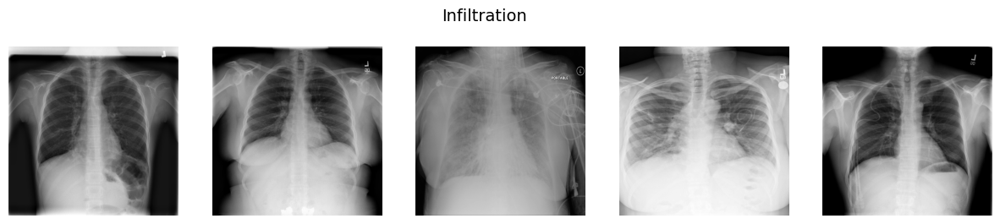

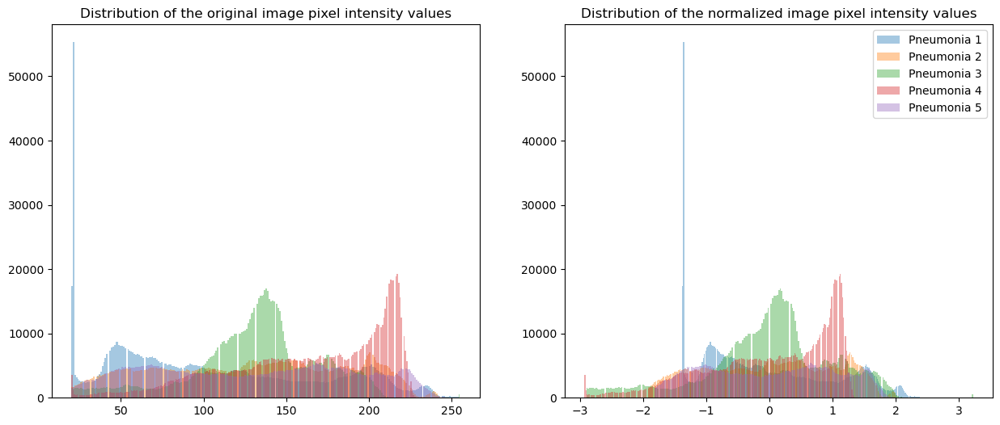

Threshold = 20
Mean values: [105.9, 128.6, 131.3, 162.6, 129.0]
Median values: [93.0, 131.0, 134.0, 172.0, 131.0]


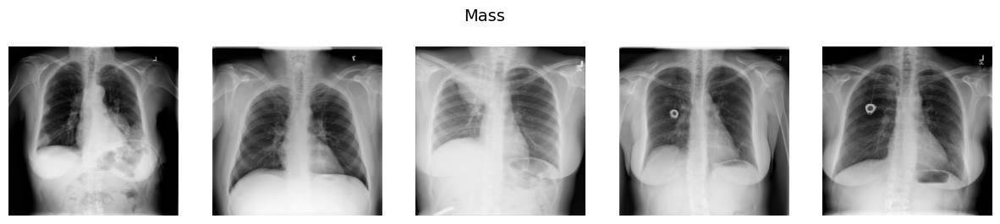

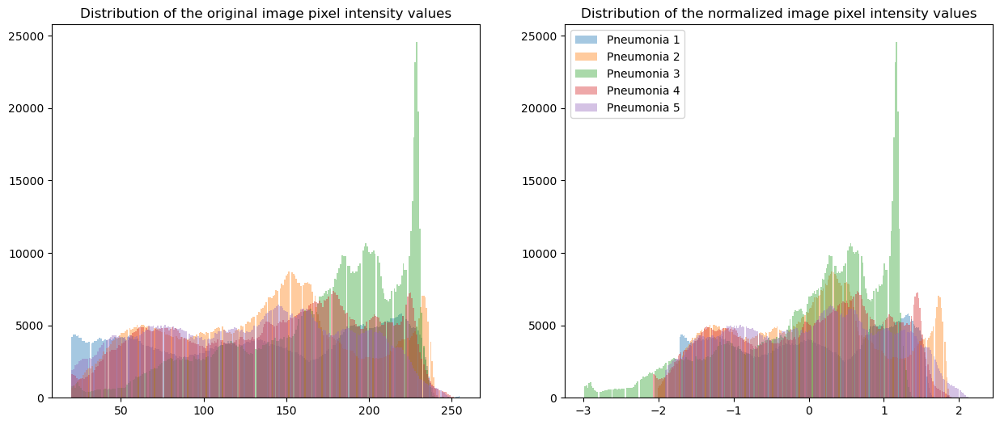

Threshold = 20
Mean values: [132.8, 134.5, 170.2, 140.8, 128.7]
Median values: [135.0, 139.0, 183.0, 149.0, 133.0]


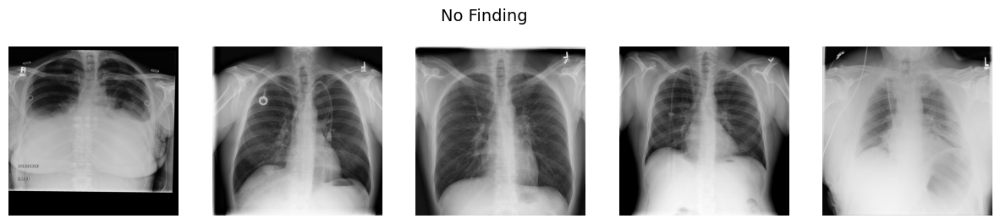

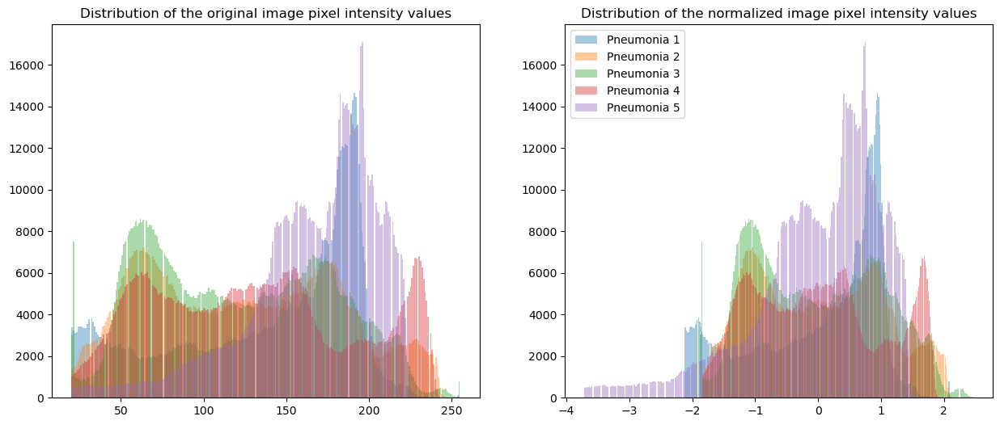

Threshold = 20
Mean values: [138.3, 123.9, 121.6, 129.9, 166.4]
Median values: [158.0, 123.0, 119.0, 128.0, 175.0]


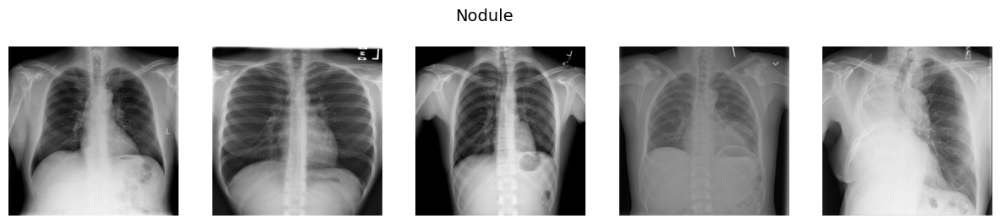

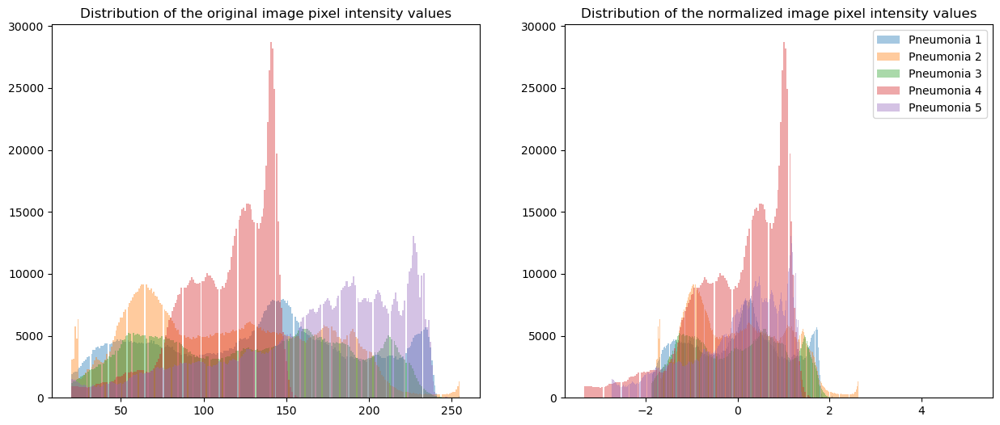

Threshold = 20
Mean values: [131.5, 114.5, 128.2, 112.7, 165.9]
Median values: [137.0, 111.0, 131.0, 120.0, 178.0]


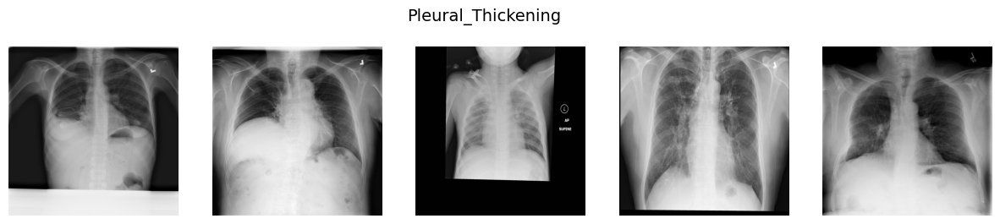

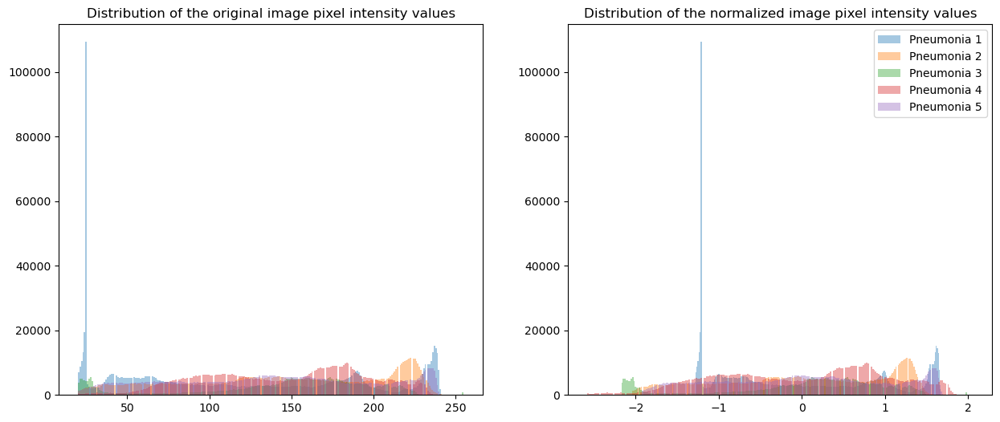

Threshold = 20
Mean values: [115.8, 145.1, 142.8, 145.7, 137.4]
Median values: [103.0, 148.0, 156.0, 152.0, 139.0]


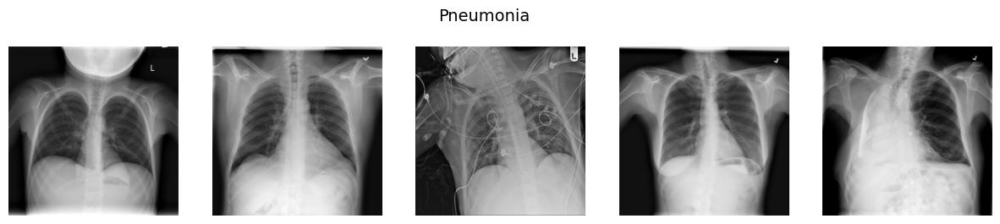

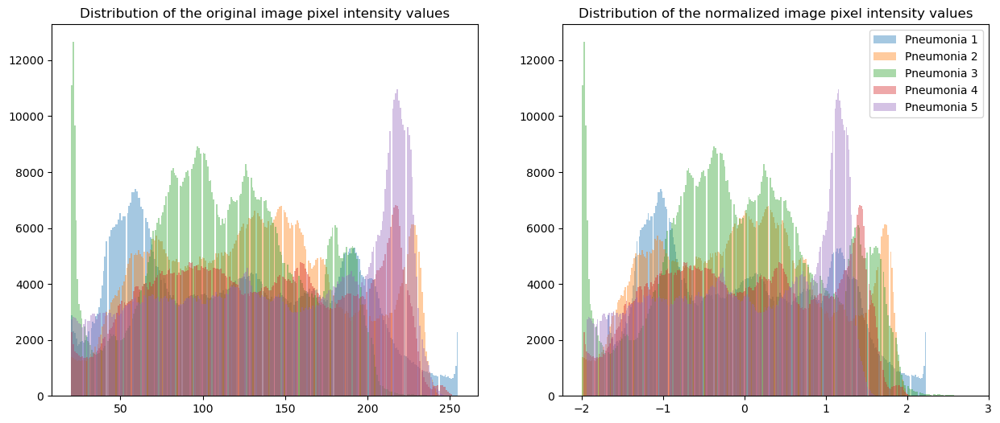

Threshold = 20
Mean values: [120.7, 131.1, 114.3, 134.5, 143.8]
Median values: [118.0, 131.0, 113.0, 134.0, 149.0]


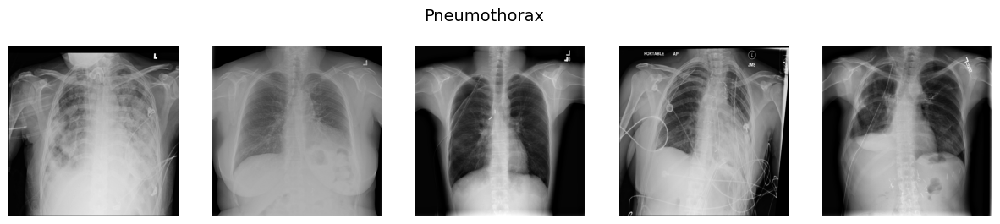

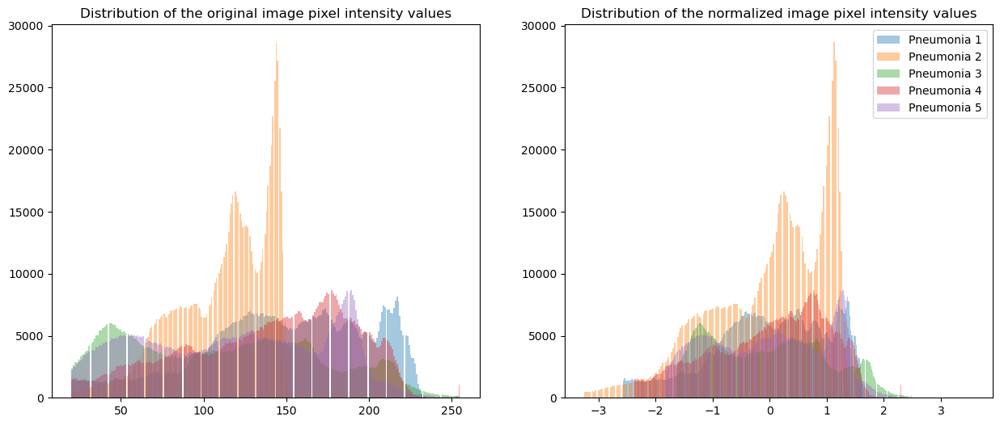

Threshold = 20
Mean values: [148.4, 112.0, 113.8, 139.0, 119.0]
Median values: [152.0, 118.0, 114.0, 147.0, 121.0]


In [31]:
# plot all distributions wiht a threshold of 20
for label_tmp, df_tmp in dic_unique_dis.items():
    n_rand_img_dist(df_tmp, label_tmp, 5, 20)

In [32]:
def average_intensities(df_tmp):
    '''
    this function will average all images from a dataframe and return an array
    dt_tmp is a dataframe
    'image_path' column must be presented in the dataframe to show the images
    '''
    arr_tmp = np.zeros((1024,1024))
    for img_tmp_path in df_tmp.image_path:
        img_tmp = imread(img_tmp_path)
        if img_tmp.shape == arr_tmp.shape:
            arr_tmp += img_tmp
        else: print(f'Image {img_tmp_path} shape is {img_tmp.shape} and it is different from (1024,1024)')
    arr_final = arr_tmp / df_tmp.image_path.shape[0]
    return arr_final

In [33]:
# compute averaged images
dic_unique_dis_avg = {}
for label_tmp, df_tmp in dic_unique_dis.items():
    print(f'Processing {label_tmp} cases')
    dic_unique_dis_avg[label_tmp] = average_intensities(df_tmp)
print('Processing is done')

Processing Atelectasis cases
Processing Cardiomegaly cases
Processing Consolidation cases
Processing Edema cases
Processing Effusion cases
Image /data/images_001/images/00000084_000.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Processing Emphysema cases
Processing Fibrosis cases
Processing Hernia cases
Processing Infiltration cases
Processing Mass cases
Processing No Finding cases
Image /data/images_001/images/00000083_000.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Image /data/images_001/images/00000206_000.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Image /data/images_001/images/00000318_004.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Image /data/images_001/images/00000370_003.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Image /data/images_001/images/00001260_000.png shape is (1024, 1024, 4) and it is different from (1024,1024)
Image /data/images_002/images/00002221_000.png sha

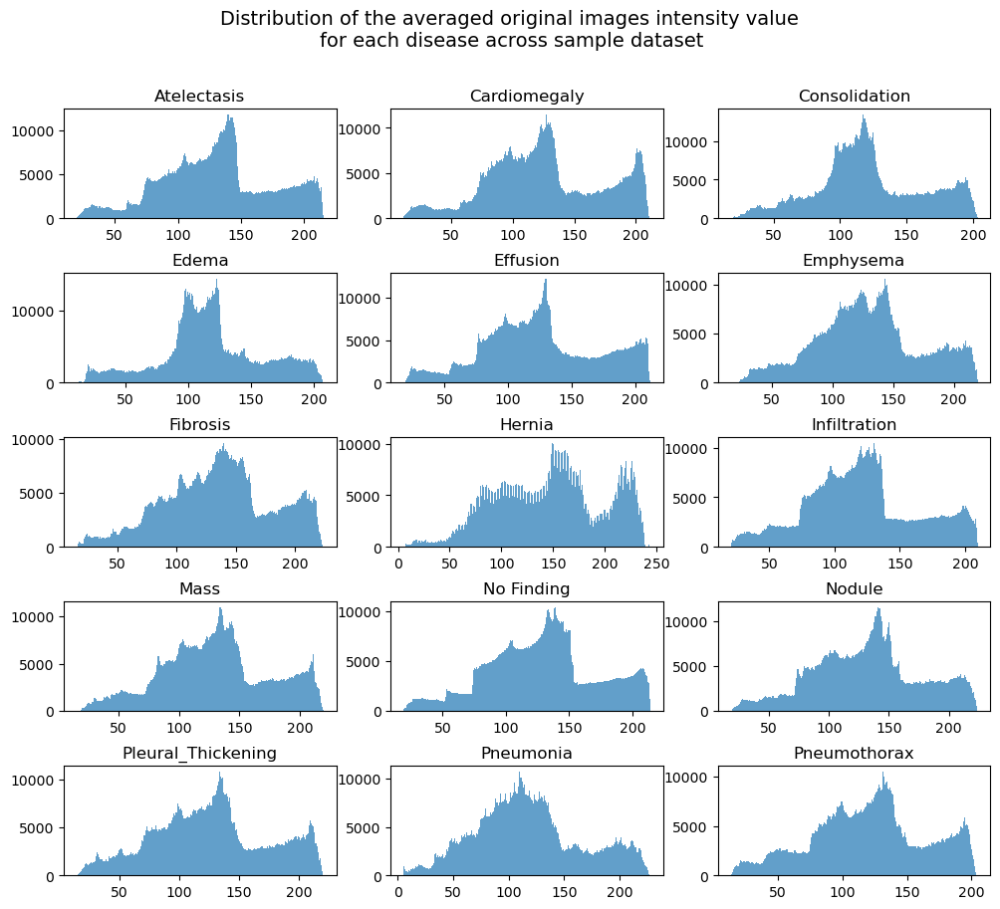

In [34]:
thr = 5
plt.figure(figsize=(12, 10))
idx = 1
for label_tmp, arr_tmp in dic_unique_dis_avg.items():
    plt.subplot(5, 3, idx)
    plt.hist(arr_tmp[arr_tmp >= thr].flatten(), bins = 256, alpha=0.7, label=f'{label_tmp}')
    idx +=1
    plt.title(f'{label_tmp}', fontsize=12)
    plt.subplots_adjust(hspace = .5)
plt.suptitle(f'Distribution of the averaged original images intensity value \nfor each disease across sample dataset', fontsize=14)
plt.show()

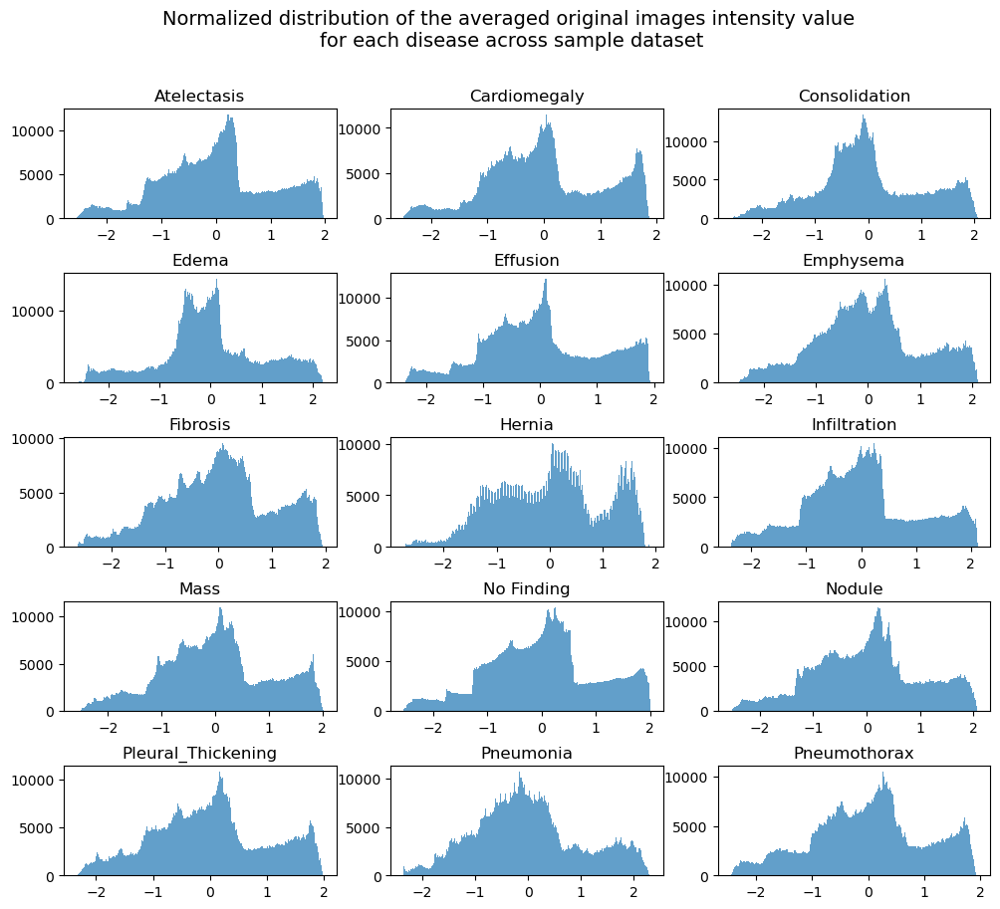

In [35]:
thr = 5
plt.figure(figsize=(12, 10))
idx = 1
for label_tmp, arr_tmp in dic_unique_dis_avg.items():
    plt.subplot(5, 3, idx)
    arr_tmp_thr = arr_tmp[arr_tmp >= thr].flatten()
    mean_tmp = arr_tmp_thr.mean()
    std_tmp = arr_tmp_thr.std()
    arr_tmp_thr_norm = (arr_tmp_thr - mean_tmp) / std_tmp
    plt.hist(arr_tmp_thr_norm, bins = 256, alpha=0.7, label=f'{label_tmp}')
    idx +=1
    plt.title(f'{label_tmp}', fontsize=12)
    plt.subplots_adjust(hspace = .5)
plt.suptitle(f'Normalized distribution of the averaged original images intensity value \nfor each disease across sample dataset', fontsize=14)
plt.show()

### It looks like that the averaged distributions looks slightly different for different diseases. Therefore, there are a lot of similarity between them. The 'Pneumonia' averaged distribution looks similar to Fibrosis, Mass and Pleural Thickening, therefore has it's own patterns. Nodule and Pneumothorax has a lot of similarity. Atelactasis, Cardiomegaly, and Effusion sims also have a lot of common pattern. No Findings looks different fro Pneumonia and a number of different diseases. Therefore, No Findings has a lot of similarities with Infiltration.

# Summary:

* There are 16 patients with age more than 100 years old. This issue has to be handled if this information will be used for model training on the demographic data. Because of there are follow up visits, the age can be restored from the information recorded during those visits. As procedure was scripted to fix the issue.
* Base on the age distributions, we can conclude that age distributions are similar for both genders with mean around 47 years old with STD of 17 years. Therefore, the gender histogram shows that there are more male cases in the entire dataset. 
* There are 1431 cases of Pneumonia in the dataset. The age mean for those patients is 44.7 years and STD is around 17.6 years. The age distributions for different genders and gender histogram for positive Pneumonia looks similar to the entire dataset. 
* 95% of patients represented in the dataset are in the range of 13 to 81 years old, and this would be one of the limitations for the algorithm usage. We may ignore the difference in Male and Female histogram due to the goal is to detect Pneumonia and we can assume that the disease will appear similarly on the images, therefore, the x-rays images with no findings may be slightly different for different genders.
* 2/3 of the images were taken in PA view. The AP images (1/3 of the dataset) have a little bit different appearance due to bigger heart shadow and altered pulmonary vasculature. It may be a minor issues due to algorithm may start learning this differences instead to look for differences in appearance due to a disease. Therefore, we will use both views for the algorithm training.
* About a half of the dataset represents cases without any findings. ~ 1/4 cases are with only one disease, around 14% have 2 diseases found on the x-rays, and ~3% represent cases with 3 identified diseases.
* There are total 112120 cases in the dataset. There are total 15 diseases presented in the dataset. The top five diseases are: Infiltration, Effusion, 'Atelectasis', Nodule, and Mass. 
* There are only 1431 Pneumonia cases presented in the dataset, which is only 1.28% of the dataset. The top five diseases comorbid with pneumonia are: Infiltration, Edema, Effusion, Atelectasis, and Consolidation. It might be interesting to note that Infiltration, Effusion, and Atelectasis are the most frequent diseases in the dataset, therefore the Edema and Consolidation with those 3 diseases are in the top five diseases comorbid with Pheumonia.
* Base on the representative X-Ray images we can conclude that it would be very difficult for non-trained person to identify a particular disease. Also, it is easy to distinguish a gender, thus the algorithm may be able to learn it, which may not be good. We have to be careful during splitting dataset and make sure that the Female/Male ratio is balanced in training/validation/test datasets.
* It looks like there are a lot of pixels with the intensities below 20. Plotting histograms for the same images but after applying a threshold of 20 before any calculations revealed that the pixel intensities distributions looks slightly different, but the mean and median values of the distributions are similar within each image. We will use this threshold for image preprocessing.
* The averaged image pixel values across each disease distributions looks slightly different for different diseases. Therefore, there are a lot of similarity between them. The 'Pneumonia' averaged distribution looks similar to Fibrosis, Mass and Pleural Thickening, therefore has it's own patterns. Nodule and Pneumothorax has a lot of similarity. Atelactasis, Cardiomegaly, and Effusion sims also have a lot of common pattern. No Findings looks different fro Pneumonia and a number of different diseases. Therefore, No Findings has a lot of similarities with Infiltration. Analyzing stated above, we will train our model on the image patterns thus avoiding those distributions similarity.